In [21]:
from sklearn.metrics import classification_report
import matplotlib.pylab as plt
import numpy as np

class ts_classifier(object):
    
    def __init__(self,plotter=False):
       
        self.preds=[]
        self.plotter=plotter

    def predict(self,train,test,w,progress=False):
      
        for ind,i in enumerate(test):
            if progress:
                print(str(ind+1)+' points classified')
            min_dist=float('inf')
            closest_seq=[]

            for j in train:
                if self.LB_Keough(i,j[:-1],5)<min_dist:
                    dist=self.DTWDistance(i,j[:-1],w)
                    if dist<min_dist:
                        min_dist=dist
                        closest_seq=j
            self.preds.append(closest_seq[-1])
            
            if self.plotter: 
                plt.plot(i)
                plt.plot(closest_seq[:-1])
                plt.legend(['Test Series','Nearest Neighbor in Training Set'])
                plt.title('Nearest Neighbor in Training Set - Prediction ='+str(closest_seq[-1]))
                plt.show()

    
    def performance(self,true_results):
       
        return(classification_report(true_results,self.preds))

    def get_preds(self):
        return(self.preds)


    def DTWDistance(self,s1,s2,w=None):
       
        DTW={}
    
        if w:
            w = max(w, abs(len(s1)-len(s2)))
    
            for i in range(-1,len(s1)):
                for j in range(-1,len(s2)):
                    DTW[(i, j)] = float('inf')
    
        else:
            for i in range(len(s1)):
                DTW[(i, -1)] = float('inf')
            for i in range(len(s2)):
                DTW[(-1, i)] = float('inf')

        DTW[(-1, -1)] = 0

        for i in range(len(s1)):
            if w:
                for j in range(max(0, i-w), min(len(s2), i+w)):
                    dist= (s1[i]-s2[j])**2
                    DTW[(i, j)] = dist + min(DTW[(i-1, j)],DTW[(i, j-1)], DTW[(i-1, j-1)])
            else:
                for j in range(len(s2)):
                    dist= (s1[i]-s2[j])**2
                    DTW[(i, j)] = dist + min(DTW[(i-1, j)],DTW[(i, j-1)], DTW[(i-1, j-1)])

        return(np.sqrt(DTW[len(s1)-1, len(s2)-1]))

    def LB_Keough(self,s1,s2,r):
        '''
        Calculates LB_Keough lower bound to dynamic time warping. Linear
        complexity compared to quadratic complexity of dtw.
        '''
        LB_sum=0
        for ind,i in enumerate(s1):
        
            lower_bound=min(s2[(ind-r if ind-r>=0 else 0):(ind+r)])
            upper_bound=max(s2[(ind-r if ind-r>=0 else 0):(ind+r)])

            if i>upper_bound:
                LB_sum=LB_sum+(i-upper_bound)**2
            elif i<lower_bound:
                LB_sum=LB_sum+(i-lower_bound)**2
                
        return np.sqrt(LB_sum)
    
    

    def knn(self,train,test,w):
        self.preds=[]
        for ind,i in enumerate(test):
            min_dist=float('inf')
            closest_seq=[]
            #print ind
            for j in train:
                if self.LB_Keough(i[:-1],j[:-1],5) < min_dist:
                    dist=self.DTWDistance(i[:-1],j[:-1],w)
                    if dist<min_dist:
                        min_dist=dist
                        closest_seq=j
            self.preds.append(closest_seq[-1])
        #return(classification_report(test[:,-1],preds))
        print(classification_report(test[:,-1],preds))
        


obj = ts_classifier(obj)

#dataset = genfromtxt(open('Data/train.csv','r'), delimiter=',', dtype='f8')[1:]
train = np.genfromtxt('Desktop/train.csv', delimiter='\t')
test = np.genfromtxt('Desktop/test.csv', delimiter='\t')
w = 4
#knn(train,test,4)
obj.knn(train,test,w)




NameError: name 'preds' is not defined

NameError: name 'self' is not defined

In [ ]:
from sklearn.metrics import classification_report
import matplotlib.pylab as plt
import numpy as np

class ts_classifier(object):
    
    def __init__(self,plotter=False):
       
        self.preds=[]
        self.plotter=plotter

    def predict(self,train,test,w,progress=False):
      
        for ind,i in enumerate(test):
            if progress:
                print(str(ind+1)+' points classified')
            min_dist=float('inf')
            closest_seq=[]

            for j in train:
                if self.LB_Keough(i,j[:-1],5)<min_dist:
                    dist=self.DTWDistance(i,j[:-1],w)
                    if dist<min_dist:
                        min_dist=dist
                        closest_seq=j
            self.preds.append(closest_seq[-1])
            
            if self.plotter: 
                plt.plot(i)
                plt.plot(closest_seq[:-1])
                plt.legend(['Test Series','Nearest Neighbor in Training Set'])
                plt.title('Nearest Neighbor in Training Set - Prediction ='+str(closest_seq[-1]))
                plt.show()

    
    def performance(self,true_results):
       
        return(classification_report(true_results,self.preds))

    def get_preds(self):
        return(self.preds)


    def DTWDistance(self,s1,s2,w=None):
       
        DTW={}
    
        if w:
            w = max(w, abs(len(s1)-len(s2)))
    
            for i in range(-1,len(s1)):
                for j in range(-1,len(s2)):
                    DTW[(i, j)] = float('inf')
    
        else:
            for i in range(len(s1)):
                DTW[(i, -1)] = float('inf')
            for i in range(len(s2)):
                DTW[(-1, i)] = float('inf')

        DTW[(-1, -1)] = 0

        for i in range(len(s1)):
            if w:
                for j in range(max(0, i-w), min(len(s2), i+w)):
                    dist= (s1[i]-s2[j])**2
                    DTW[(i, j)] = dist + min(DTW[(i-1, j)],DTW[(i, j-1)], DTW[(i-1, j-1)])
            else:
                for j in range(len(s2)):
                    dist= (s1[i]-s2[j])**2
                    DTW[(i, j)] = dist + min(DTW[(i-1, j)],DTW[(i, j-1)], DTW[(i-1, j-1)])

        return(np.sqrt(DTW[len(s1)-1, len(s2)-1]))

    def LB_Keough(self,s1,s2,r):
        '''
        Calculates LB_Keough lower bound to dynamic time warping. Linear
        complexity compared to quadratic complexity of dtw.
        '''
        LB_sum=0
        for ind,i in enumerate(s1):
        
            lower_bound=min(s2[(ind-r if ind-r>=0 else 0):(ind+r)])
            upper_bound=max(s2[(ind-r if ind-r>=0 else 0):(ind+r)])

            if i>upper_bound:
                LB_sum=LB_sum+(i-upper_bound)**2
            elif i<lower_bound:
                LB_sum=LB_sum+(i-lower_bound)**2
                
        return np.sqrt(LB_sum)
    
    

    def knn(self,train,test,w):
        self.preds=[]
        for ind,i in enumerate(test):
            min_dist=float('inf')
            closest_seq=[]
            #print ind
            for j in train:
                if self.LB_Keough(i[:-1],j[:-1],5) < min_dist:
                    dist=self.DTWDistance(i[:-1],j[:-1],w)
                    if dist<min_dist:
                        min_dist=dist
                        closest_seq=j
            self.preds.append(closest_seq[-1])
        #return(classification_report(test[:,-1],preds))
        print(classification_report(test[:,-1],preds))
        


#obj = ts_classifier(obj)

#dataset = genfromtxt(open('Data/train.csv','r'), delimiter=',', dtype='f8')[1:]
train = np.genfromtxt('Desktop/train.csv', delimiter='\t')
test = np.genfromtxt('Desktop/test.csv', delimiter='\t')
w = 4
#knn(train,test,4)
ts_classifier.knn(train,test,w)




In [24]:
from sklearn.metrics import classification_report
import matplotlib.pylab as plt
import numpy as np

class ts_classifier(object):
    
    def __init__(self,plotter=False):
       
        self.preds=[]
        self.plotter=plotter

    def predict(self,train,test,w,progress=False):
      
        for ind,i in enumerate(test):
            if progress:
                print(str(ind+1)+' points classified')
            min_dist=float('inf')
            closest_seq=[]

            for j in train:
                if self.LB_Keough(i,j[:-1],5)<min_dist:
                    dist=self.DTWDistance(i,j[:-1],w)
                    if dist<min_dist:
                        min_dist=dist
                        closest_seq=j
            self.preds.append(closest_seq[-1])
            
            if self.plotter: 
                plt.plot(i)
                plt.plot(closest_seq[:-1])
                plt.legend(['Test Series','Nearest Neighbor in Training Set'])
                plt.title('Nearest Neighbor in Training Set - Prediction ='+str(closest_seq[-1]))
                plt.show()

    
    def performance(self,true_results):
       
        return(classification_report(true_results,self.preds))

    def get_preds(self):
        return(self.preds)


    def DTWDistance(self,s1,s2,w=None):
       
        DTW={}
    
        if w:
            w = max(w, abs(len(s1)-len(s2)))
    
            for i in range(-1,len(s1)):
                for j in range(-1,len(s2)):
                    DTW[(i, j)] = float('inf')
    
        else:
            for i in range(len(s1)):
                DTW[(i, -1)] = float('inf')
            for i in range(len(s2)):
                DTW[(-1, i)] = float('inf')

        DTW[(-1, -1)] = 0

        for i in range(len(s1)):
            if w:
                for j in range(max(0, i-w), min(len(s2), i+w)):
                    dist= (s1[i]-s2[j])**2
                    DTW[(i, j)] = dist + min(DTW[(i-1, j)],DTW[(i, j-1)], DTW[(i-1, j-1)])
            else:
                for j in range(len(s2)):
                    dist= (s1[i]-s2[j])**2
                    DTW[(i, j)] = dist + min(DTW[(i-1, j)],DTW[(i, j-1)], DTW[(i-1, j-1)])

        return(np.sqrt(DTW[len(s1)-1, len(s2)-1]))

    def LB_Keough(self,s1,s2,r):
        '''
        Calculates LB_Keough lower bound to dynamic time warping. Linear
        complexity compared to quadratic complexity of dtw.
        '''
        LB_sum=0
        for ind,i in enumerate(s1):
        
            lower_bound=min(s2[(ind-r if ind-r>=0 else 0):(ind+r)])
            upper_bound=max(s2[(ind-r if ind-r>=0 else 0):(ind+r)])

            if i>upper_bound:
                LB_sum=LB_sum+(i-upper_bound)**2
            elif i<lower_bound:
                LB_sum=LB_sum+(i-lower_bound)**2
                
        return np.sqrt(LB_sum)
    
    

    def knn(train,test,w):
        self.preds=[]
        for ind,i in enumerate(test):
            min_dist=float('inf')
            closest_seq=[]
            #print ind
            for j in train:
                if self.LB_Keough(i[:-1],j[:-1],5) < min_dist:
                    dist=self.DTWDistance(i[:-1],j[:-1],w)
                    if dist<min_dist:
                        min_dist=dist
                        closest_seq=j
            self.preds.append(closest_seq[-1])
        #return(classification_report(test[:,-1],preds))
        print(classification_report(test[:,-1],preds))
        


#obj = ts_classifier(obj)

#dataset = genfromtxt(open('Data/train.csv','r'), delimiter=',', dtype='f8')[1:]
train = np.genfromtxt('Desktop/train.csv', delimiter='\t')
test = np.genfromtxt('Desktop/test.csv', delimiter='\t')
w = 4
#knn(train,test,4)
ts_classifier.knn(self,train,test,w)




NameError: name 'self' is not defined

In [28]:
from sklearn.metrics import classification_report
import matplotlib.pylab as plt
import numpy as np

class ts_classifier(object):
    
    def __init__(self,plotter=False):
       
        self.preds=[]
        self.plotter=plotter

    def predict(self,train,test,w,progress=False):
      
        for ind,i in enumerate(test):
            if progress:
                print(str(ind+1)+' points classified')
            min_dist=float('inf')
            closest_seq=[]

            for j in train:
                if self.LB_Keough(i,j[:-1],5)<min_dist:
                    dist=self.DTWDistance(i,j[:-1],w)
                    if dist<min_dist:
                        min_dist=dist
                        closest_seq=j
            self.preds.append(closest_seq[-1])
            
            if self.plotter: 
                plt.plot(i)
                plt.plot(closest_seq[:-1])
                plt.legend(['Test Series','Nearest Neighbor in Training Set'])
                plt.title('Nearest Neighbor in Training Set - Prediction ='+str(closest_seq[-1]))
                plt.show()

    
    def performance(self,true_results):
       
        return(classification_report(true_results,self.preds))

    def get_preds(self):
        return(self.preds)


    def DTWDistance(self,s1,s2,w=None):
       
        DTW={}
    
        if w:
            w = max(w, abs(len(s1)-len(s2)))
    
            for i in range(-1,len(s1)):
                for j in range(-1,len(s2)):
                    DTW[(i, j)] = float('inf')
    
        else:
            for i in range(len(s1)):
                DTW[(i, -1)] = float('inf')
            for i in range(len(s2)):
                DTW[(-1, i)] = float('inf')

        DTW[(-1, -1)] = 0

        for i in range(len(s1)):
            if w:
                for j in range(max(0, i-w), min(len(s2), i+w)):
                    dist= (s1[i]-s2[j])**2
                    DTW[(i, j)] = dist + min(DTW[(i-1, j)],DTW[(i, j-1)], DTW[(i-1, j-1)])
            else:
                for j in range(len(s2)):
                    dist= (s1[i]-s2[j])**2
                    DTW[(i, j)] = dist + min(DTW[(i-1, j)],DTW[(i, j-1)], DTW[(i-1, j-1)])

        return(np.sqrt(DTW[len(s1)-1, len(s2)-1]))

    def LB_Keough(self,s1,s2,r):
        '''
        Calculates LB_Keough lower bound to dynamic time warping. Linear
        complexity compared to quadratic complexity of dtw.
        '''
        LB_sum=0
        for ind,i in enumerate(s1):
        
            lower_bound=min(s2[(ind-r if ind-r>=0 else 0):(ind+r)])
            upper_bound=max(s2[(ind-r if ind-r>=0 else 0):(ind+r)])

            if i>upper_bound:
                LB_sum=LB_sum+(i-upper_bound)**2
            elif i<lower_bound:
                LB_sum=LB_sum+(i-lower_bound)**2
                
        return np.sqrt(LB_sum)
    
    

    def knn(train,test,w):
        preds=[]
        for ind,i in enumerate(test):
            min_dist=float('inf')
            closest_seq=[]
            #print ind
            for j in train:
                if LB_Keough(i[:-1],j[:-1],5) < min_dist:
                    dist=DTWDistance(i[:-1],j[:-1],w)
                    if dist<min_dist:
                        min_dist=dist
                        closest_seq=j
            preds.append(closest_seq[-1])
        #return(classification_report(test[:,-1],preds))
        print(classification_report(test[:,-1],preds))
        


#obj = ts_classifier(obj)

#dataset = genfromtxt(open('Data/train.csv','r'), delimiter=',', dtype='f8')[1:]
train = np.genfromtxt('Desktop/train.csv', delimiter='\t')
test = np.genfromtxt('Desktop/test.csv', delimiter='\t')
w = 4
#knn(train,test,4)
ts_classifier.knn(train,test,w)




NameError: name 'LB_Keough' is not defined

In [ ]:
from sklearn.metrics import classification_report
import matplotlib.pylab as plt
import numpy as np

class ts_classifier(object):
    
    def __init__(self,plotter = False):
       
        self.preds=[]
        self.plotter=plotter

    def predict(self,train,test,w,progress=False):
      
        for ind,i in enumerate(test):
            if progress:
                print(str(ind+1)+' points classified')
            min_dist=float('inf')
            closest_seq=[]

            for j in train:
                if self.LB_Keough(i,j[:-1],5)<min_dist:
                    dist=self.DTWDistance(i,j[:-1],w)
                    if dist<min_dist:
                        min_dist=dist
                        closest_seq=j
            self.preds.append(closest_seq[-1])
            
            if self.plotter: 
                plt.plot(i)
                plt.plot(closest_seq[:-1])
                plt.legend(['Test Series','Nearest Neighbor in Training Set'])
                plt.title('Nearest Neighbor in Training Set - Prediction ='+str(closest_seq[-1]))
                plt.show()

    
    def performance(self,true_results):
       
        return(classification_report(true_results,self.preds))

    def get_preds(self):
        return(self.preds)


    def DTWDistance(self,s1,s2,w=None):
       
        DTW={}
    
        if w:
            w = max(w, abs(len(s1)-len(s2)))
    
            for i in range(-1,len(s1)):
                for j in range(-1,len(s2)):
                    DTW[(i, j)] = float('inf')
    
        else:
            for i in range(len(s1)):
                DTW[(i, -1)] = float('inf')
            for i in range(len(s2)):
                DTW[(-1, i)] = float('inf')

        DTW[(-1, -1)] = 0

        for i in range(len(s1)):
            if w:
                for j in range(max(0, i-w), min(len(s2), i+w)):
                    dist= (s1[i]-s2[j])**2
                    DTW[(i, j)] = dist + min(DTW[(i-1, j)],DTW[(i, j-1)], DTW[(i-1, j-1)])
            else:
                for j in range(len(s2)):
                    dist= (s1[i]-s2[j])**2
                    DTW[(i, j)] = dist + min(DTW[(i-1, j)],DTW[(i, j-1)], DTW[(i-1, j-1)])

        return(np.sqrt(DTW[len(s1)-1, len(s2)-1]))

    def LB_Keough(self,s1,s2,r):
        '''
        Calculates LB_Keough lower bound to dynamic time warping. Linear
        complexity compared to quadratic complexity of dtw.
        '''
        LB_sum=0
        for ind,i in enumerate(s1):
        
            lower_bound=min(s2[(ind-r if ind-r>=0 else 0):(ind+r)])
            upper_bound=max(s2[(ind-r if ind-r>=0 else 0):(ind+r)])

            if i>upper_bound:
                LB_sum=LB_sum+(i-upper_bound)**2
            elif i<lower_bound:
                LB_sum=LB_sum+(i-lower_bound)**2
                
        return np.sqrt(LB_sum)
    
    

    def knn(self,train,test,w):
        self.preds=[]
        for ind,i in enumerate(test):
            min_dist=float('inf')
            closest_seq=[]
            #print ind
            for j in train:
                if self.LB_Keough(i[:-1],j[:-1],5) < min_dist:
                    dist=self.DTWDistance(i[:-1],j[:-1],w)
                    if dist<min_dist:
                        min_dist=dist
                        closest_seq=j
            self.preds.append(closest_seq[-1])
        return(classification_report(test[:,-1],self.preds))
        #print(classification_report(test[:,-1],preds))
        


obj = ts_classifier(False)

#dataset = genfromtxt(open('Data/train.csv','r'), delimiter=',', dtype='f8')[1:]
train = np.genfromtxt('Desktop/train.csv', delimiter='\t')
test = np.genfromtxt('Desktop/test.csv', delimiter='\t')
w = 4
#knn(train,test,4)
#obj.knn(train,test,w)
print(obj.knn(train,test,w))

             precision    recall  f1-score   support

        1.0       1.00      0.96      0.98        50
        2.0       0.96      1.00      0.98        50
        3.0       1.00      1.00      1.00        50
        4.0       0.98      1.00      0.99        50
        5.0       1.00      1.00      1.00        50
        6.0       1.00      0.98      0.99        50

avg / total       0.99      0.99      0.99       300

             precision    recall  f1-score   support

        1.0       1.00      0.96      0.98        50
        2.0       0.96      1.00      0.98        50
        3.0       1.00      1.00      1.00        50
        4.0       0.98      1.00      0.99        50
        5.0       1.00      1.00      1.00        50
        6.0       1.00      0.98      0.99        50

avg / total       0.99      0.99      0.99       300

1 points classified


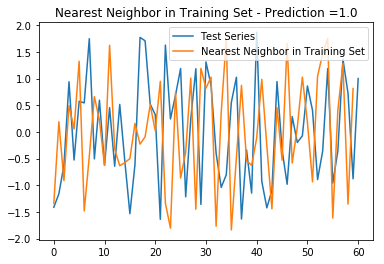

2 points classified


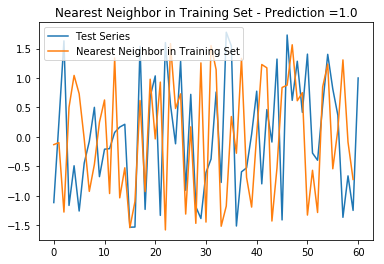

3 points classified


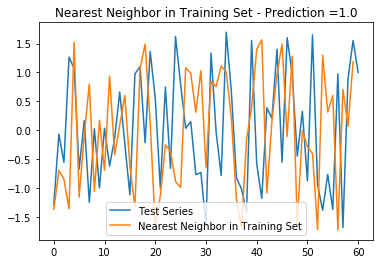

4 points classified


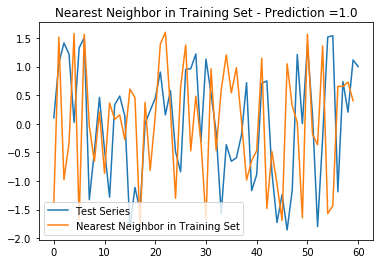

5 points classified


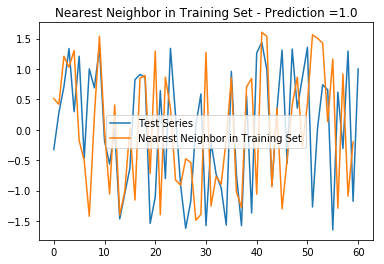

6 points classified


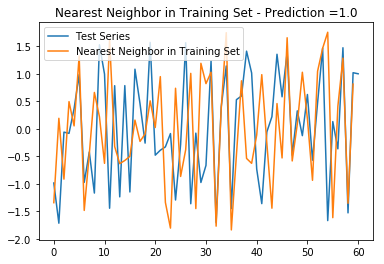

7 points classified


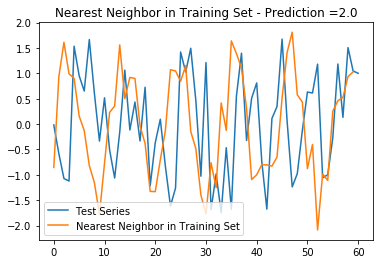

8 points classified


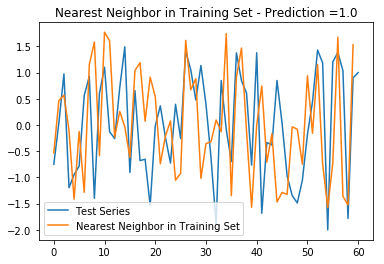

9 points classified


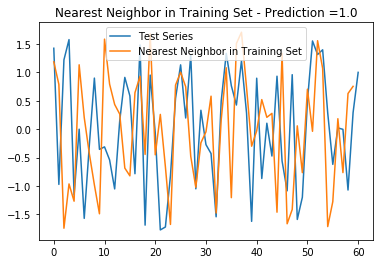

10 points classified


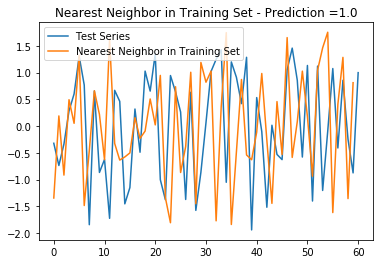

11 points classified


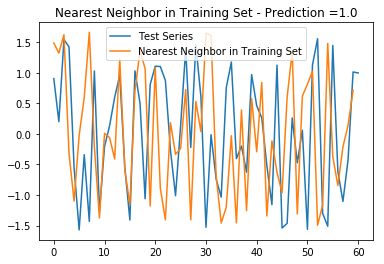

12 points classified


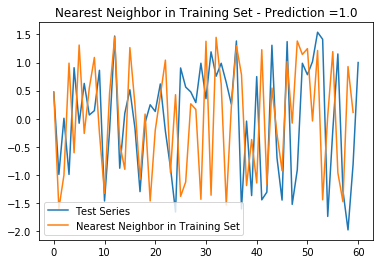

13 points classified


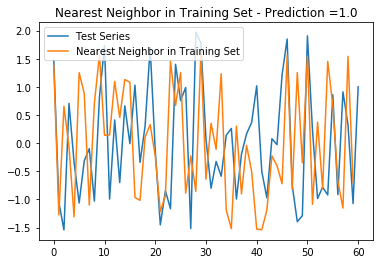

14 points classified


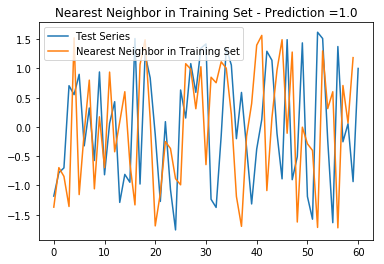

15 points classified


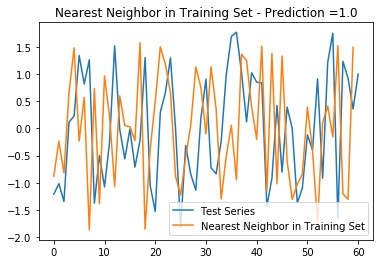

16 points classified


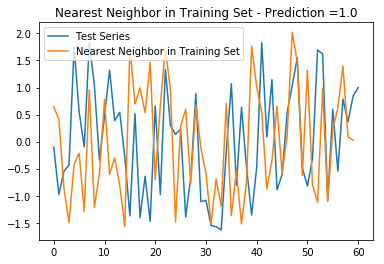

17 points classified


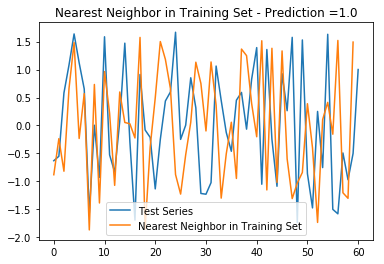

18 points classified


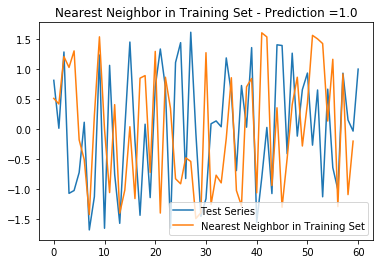

19 points classified


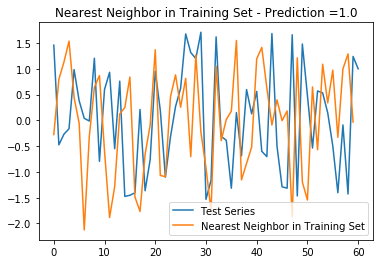

20 points classified


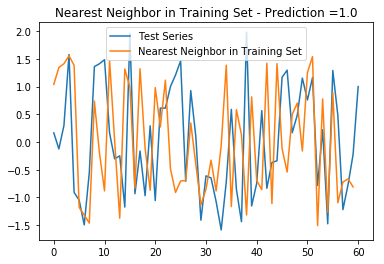

21 points classified


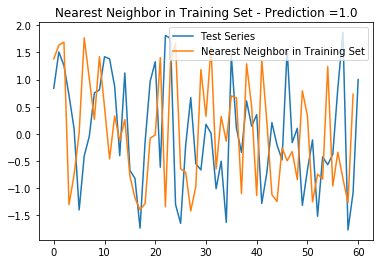

22 points classified


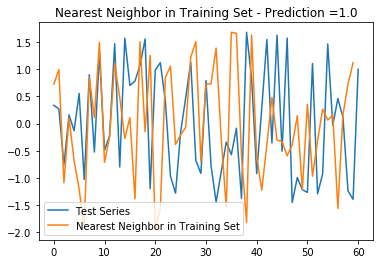

23 points classified


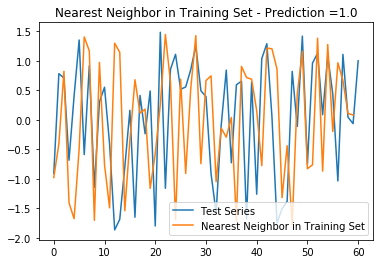

24 points classified


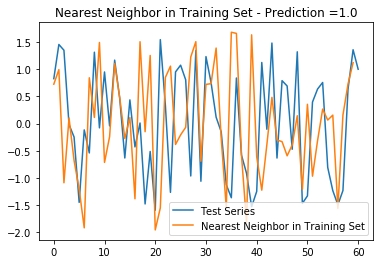

25 points classified


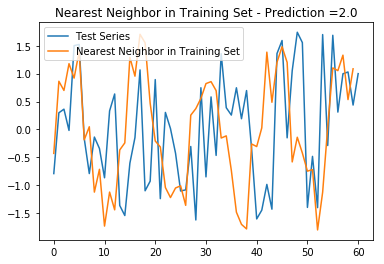

26 points classified


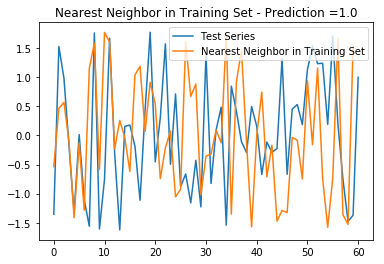

27 points classified


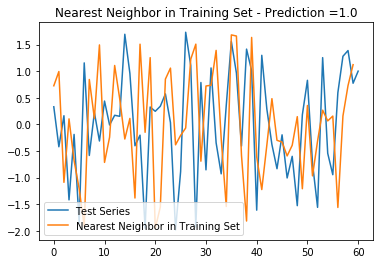

28 points classified


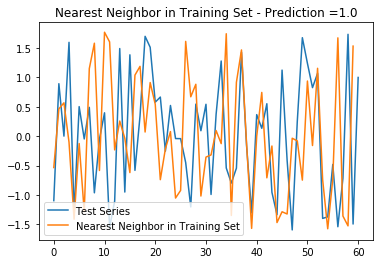

29 points classified


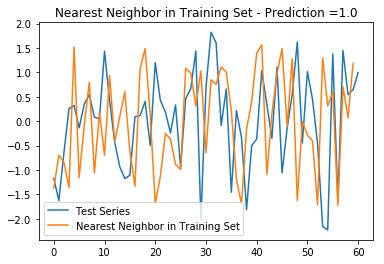

30 points classified


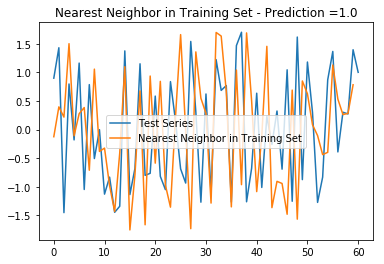

31 points classified


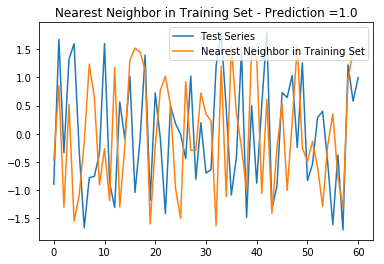

32 points classified


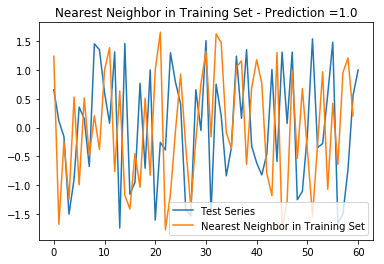

33 points classified


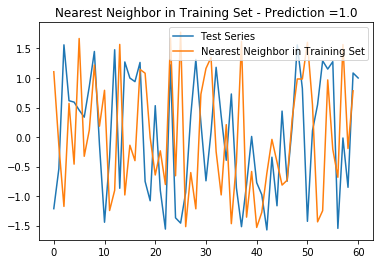

34 points classified


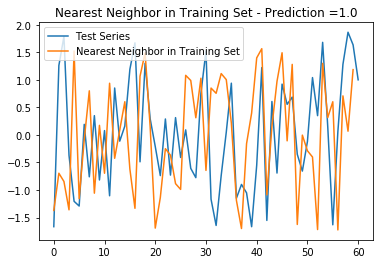

35 points classified


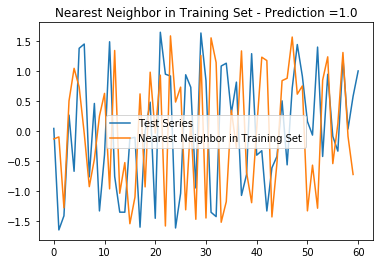

36 points classified


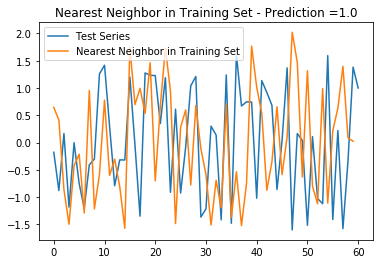

37 points classified


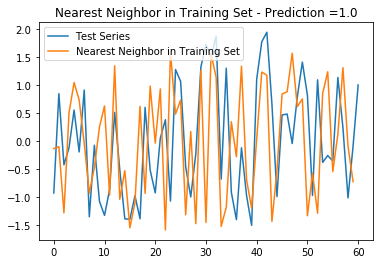

38 points classified


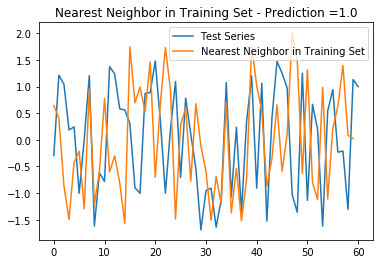

39 points classified


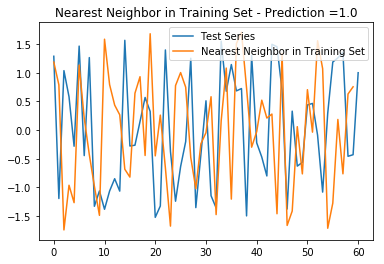

40 points classified


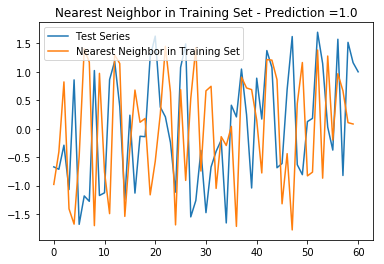

41 points classified


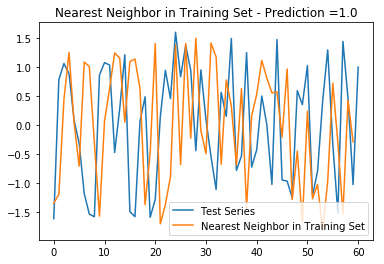

42 points classified


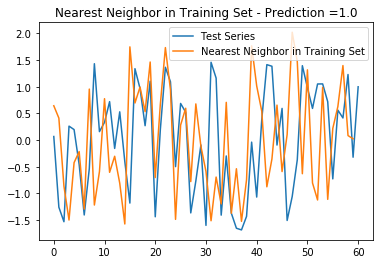

43 points classified


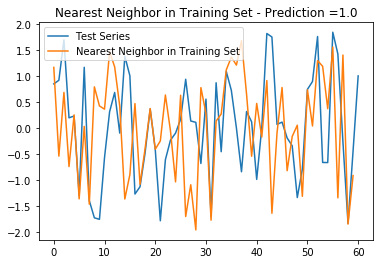

44 points classified


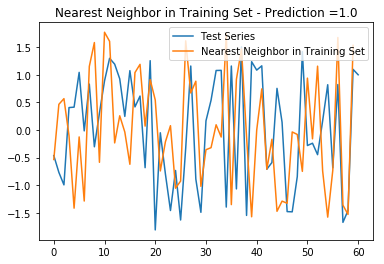

45 points classified


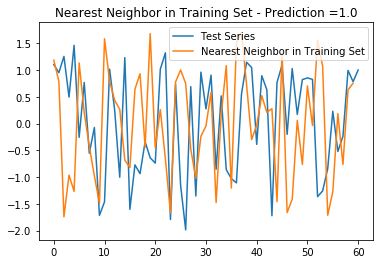

46 points classified


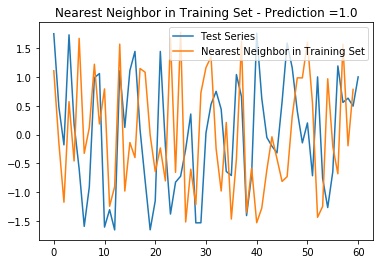

47 points classified


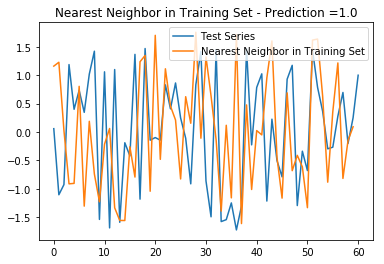

48 points classified


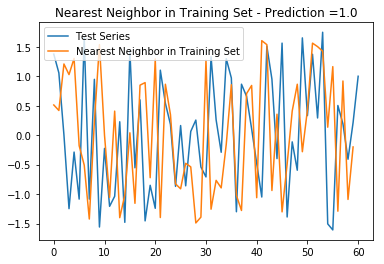

49 points classified


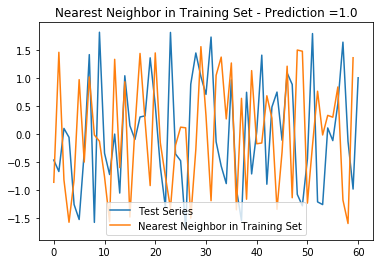

50 points classified


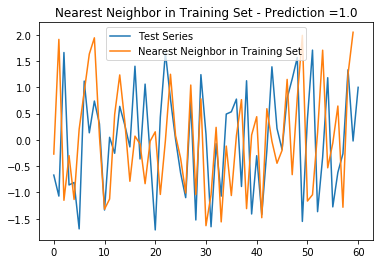

51 points classified


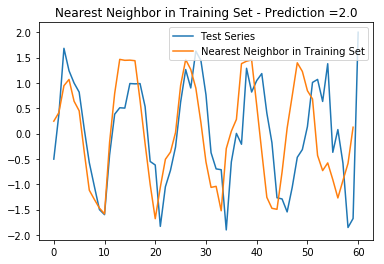

52 points classified


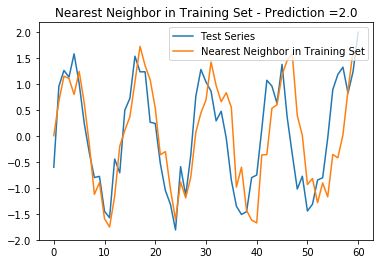

53 points classified


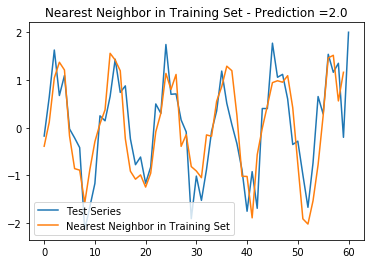

54 points classified


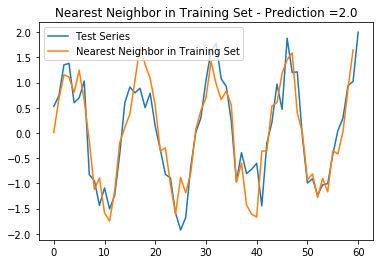

55 points classified


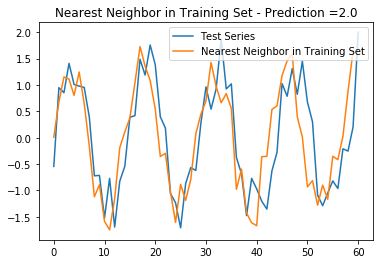

56 points classified


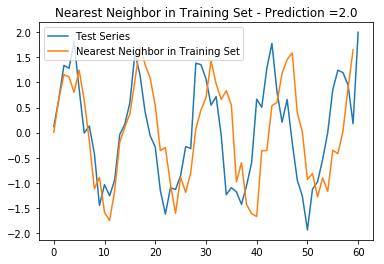

57 points classified


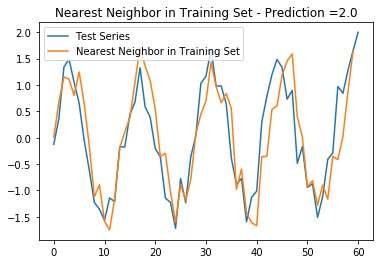

58 points classified


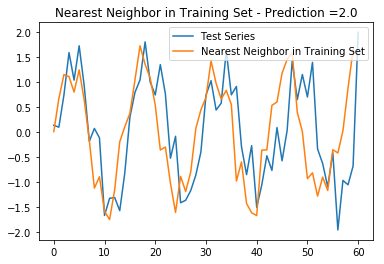

59 points classified


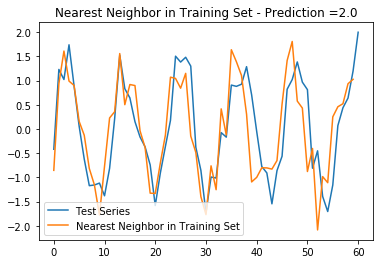

60 points classified


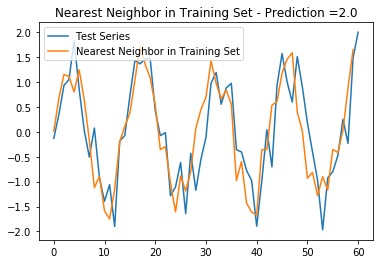

61 points classified


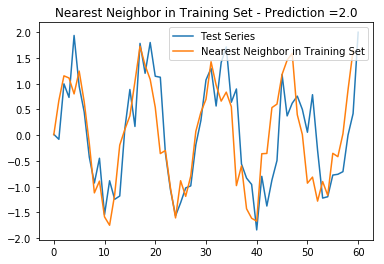

62 points classified


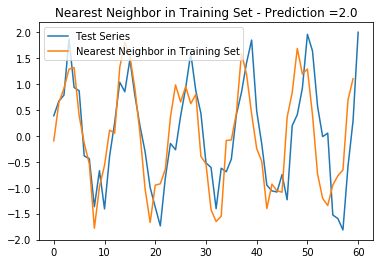

63 points classified


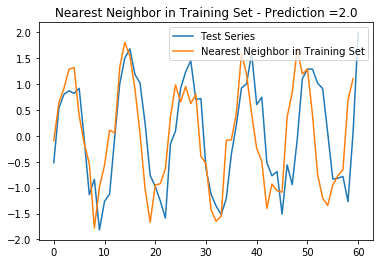

64 points classified


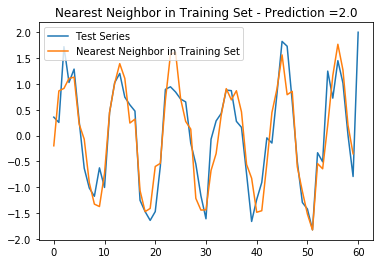

65 points classified


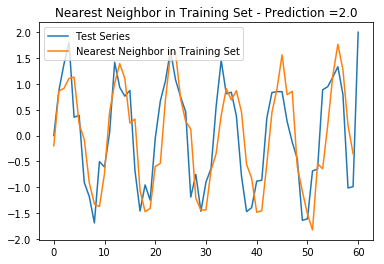

66 points classified


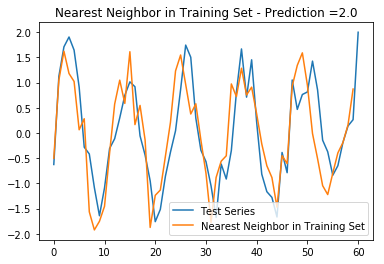

67 points classified


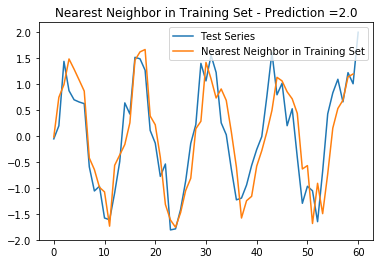

68 points classified


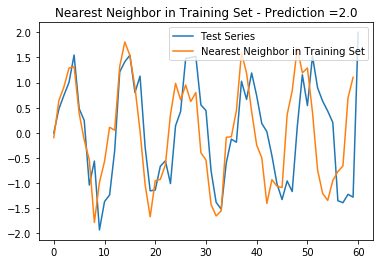

69 points classified


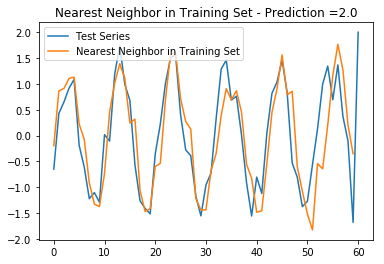

70 points classified


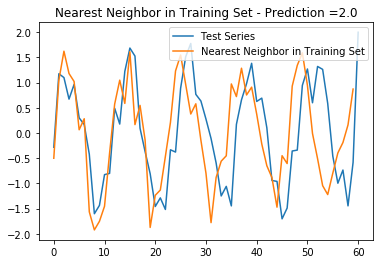

71 points classified


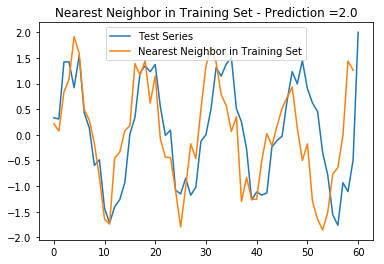

72 points classified


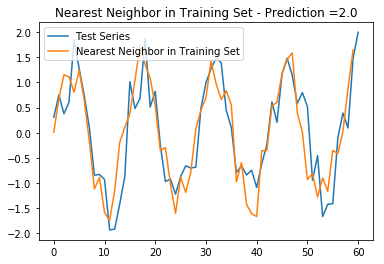

73 points classified


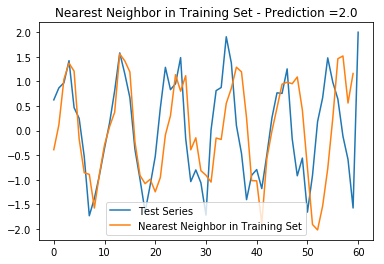

74 points classified


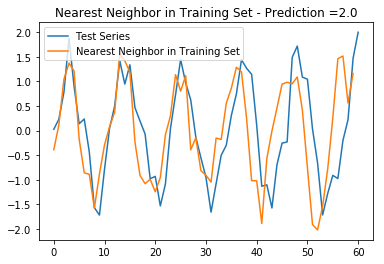

75 points classified


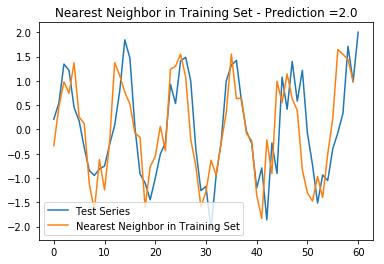

76 points classified


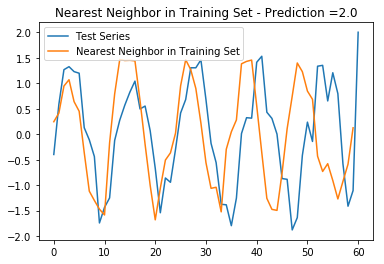

77 points classified


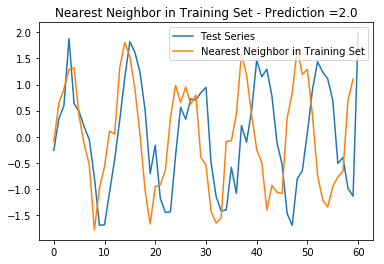

78 points classified


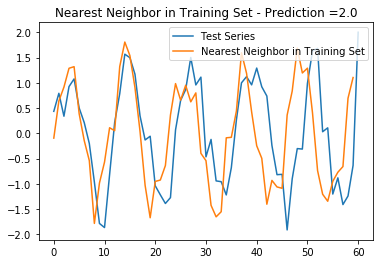

79 points classified


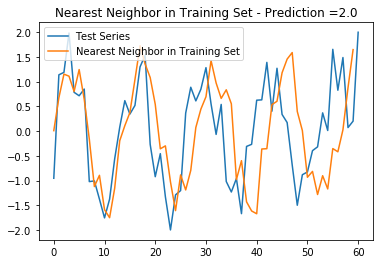

80 points classified


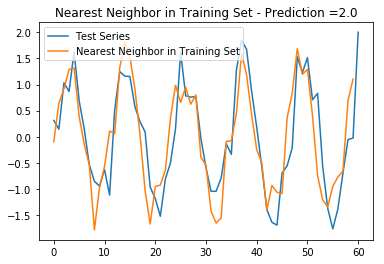

81 points classified


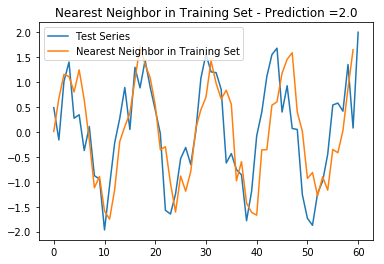

82 points classified


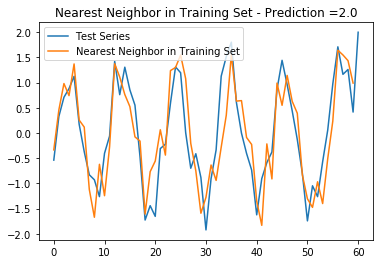

83 points classified


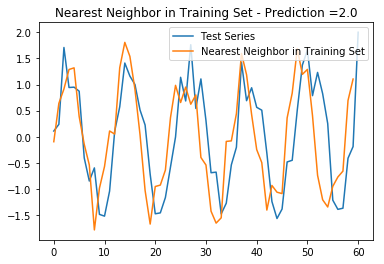

84 points classified


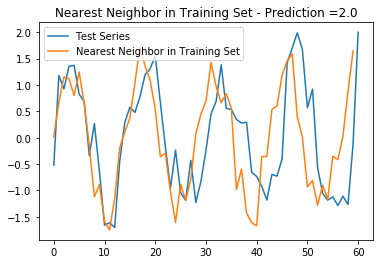

85 points classified


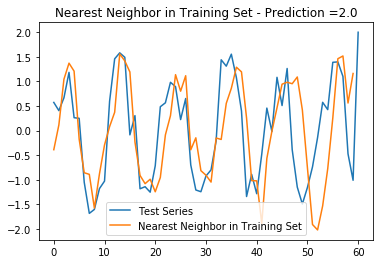

86 points classified


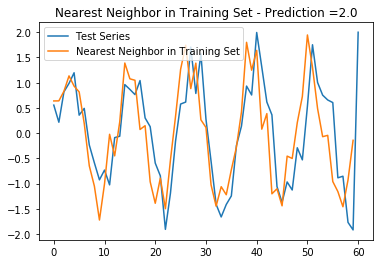

87 points classified


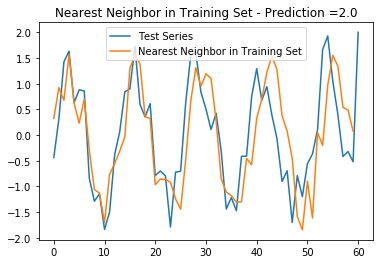

88 points classified


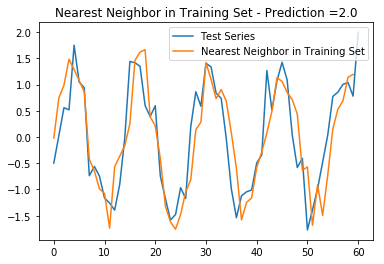

89 points classified


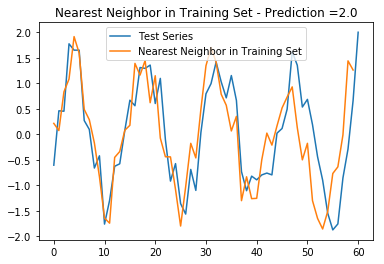

90 points classified


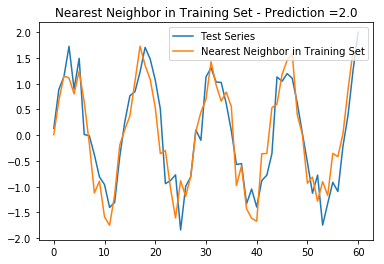

91 points classified


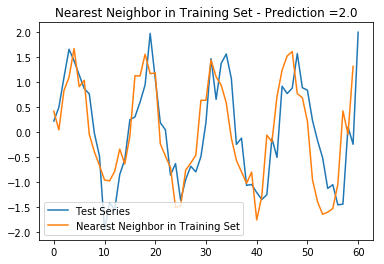

92 points classified


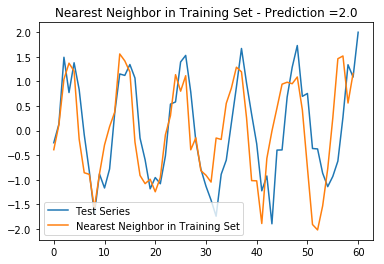

93 points classified


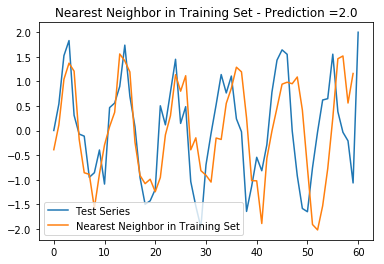

94 points classified


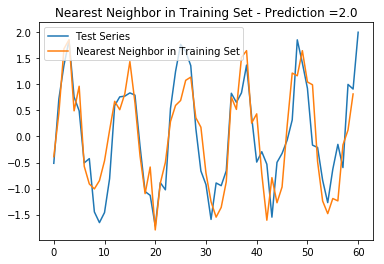

95 points classified


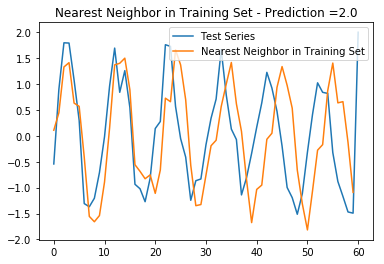

96 points classified


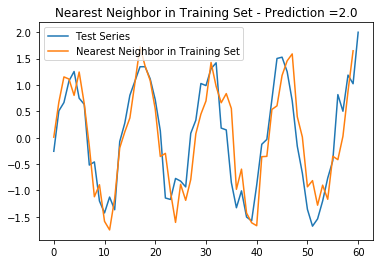

97 points classified


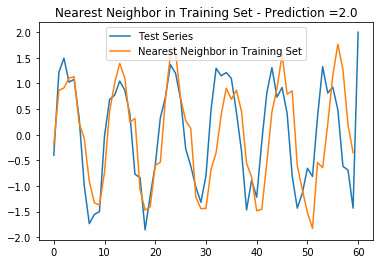

98 points classified


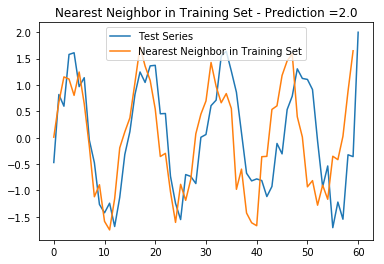

99 points classified


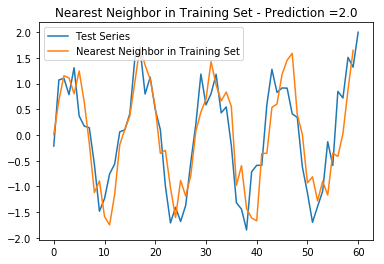

100 points classified


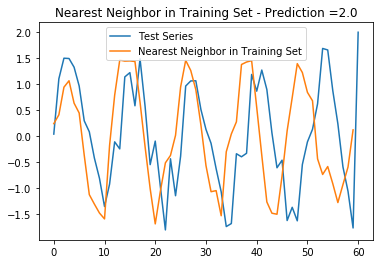

101 points classified


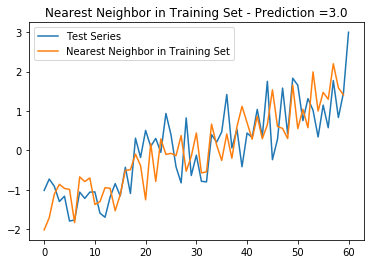

102 points classified


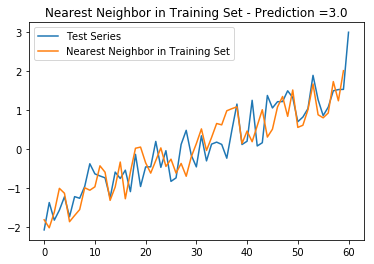

103 points classified


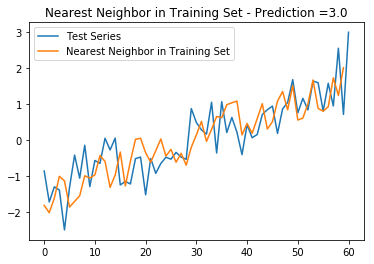

104 points classified


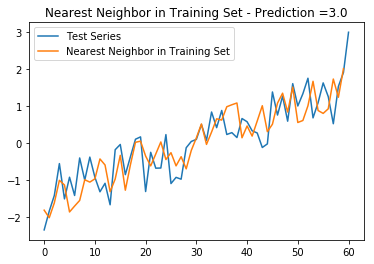

105 points classified


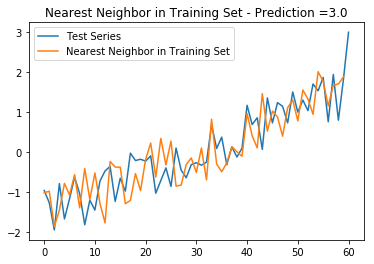

106 points classified


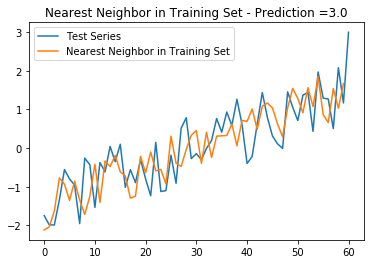

107 points classified


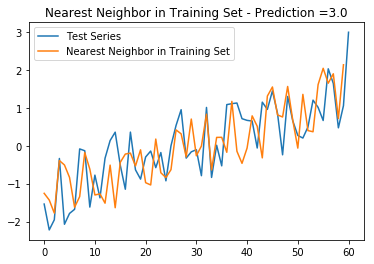

108 points classified


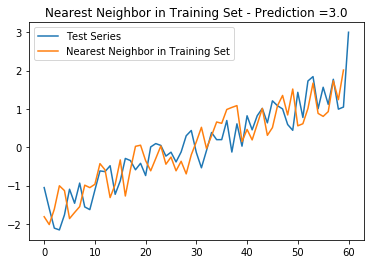

109 points classified


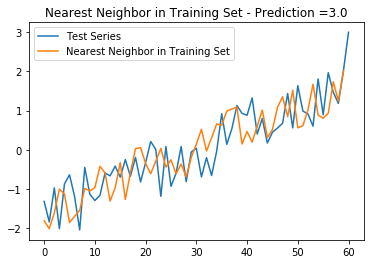

110 points classified


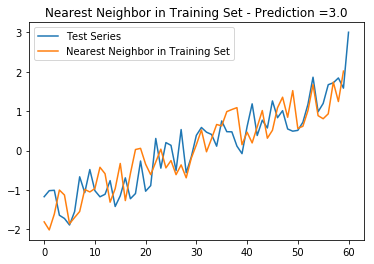

111 points classified


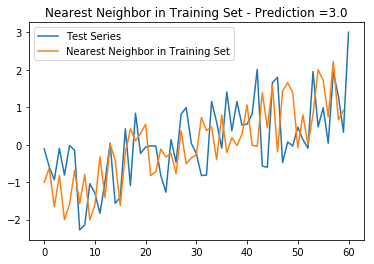

112 points classified


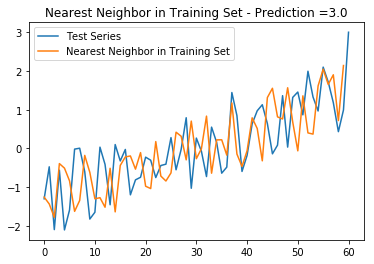

113 points classified


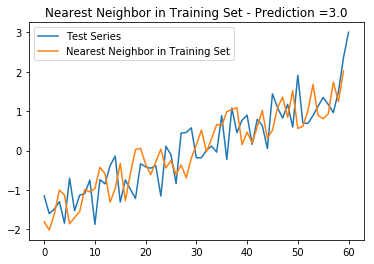

114 points classified


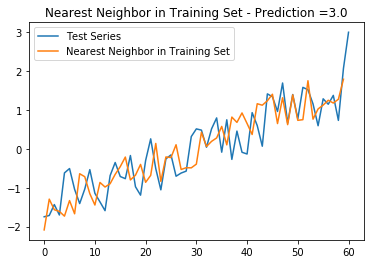

115 points classified


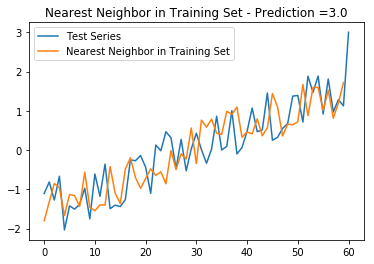

116 points classified


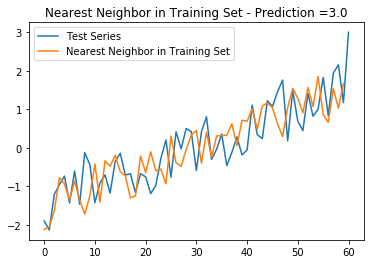

117 points classified


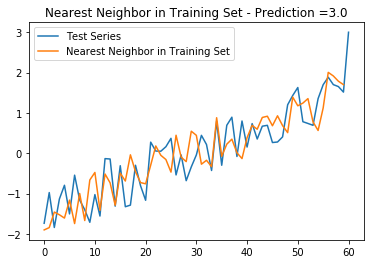

118 points classified


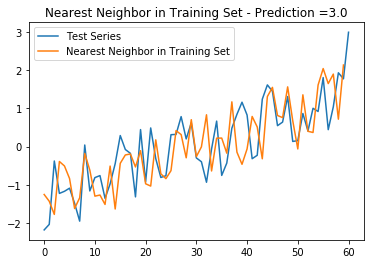

119 points classified


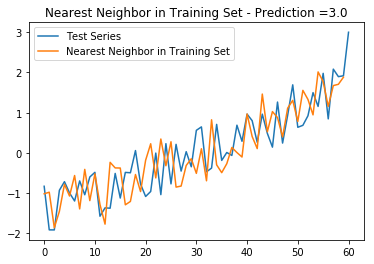

120 points classified


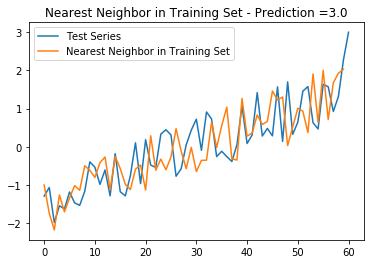

121 points classified


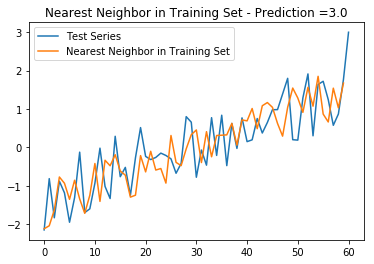

122 points classified


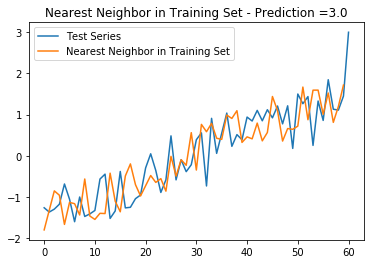

123 points classified


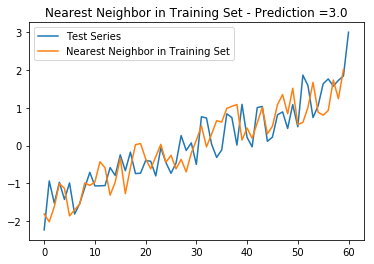

124 points classified


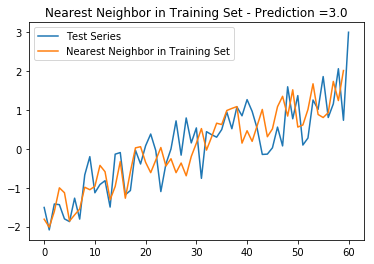

125 points classified


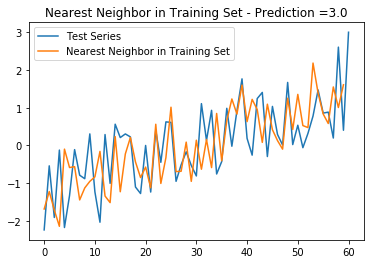

126 points classified


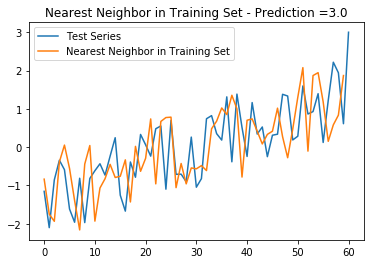

127 points classified


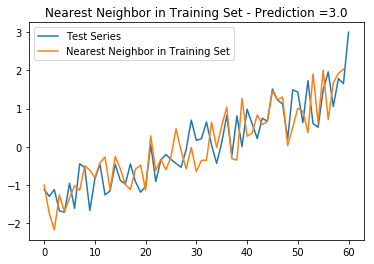

128 points classified


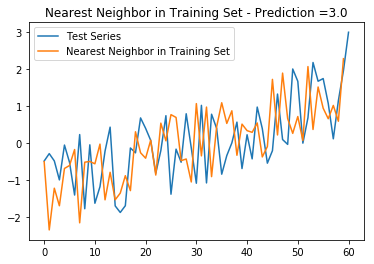

129 points classified


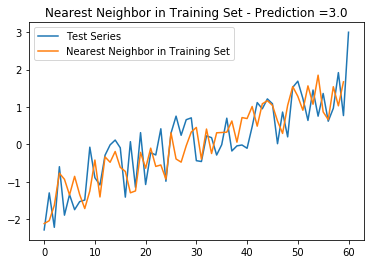

130 points classified


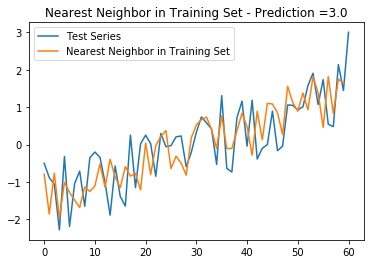

131 points classified


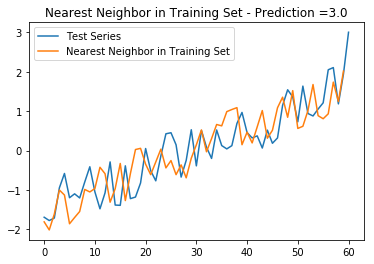

132 points classified


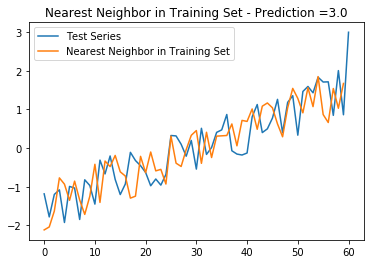

133 points classified


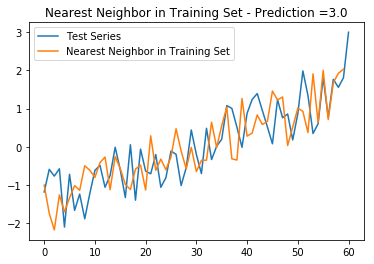

134 points classified


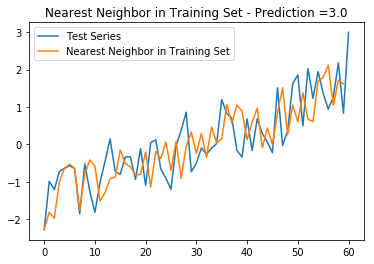

135 points classified


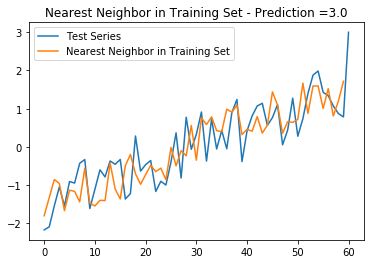

136 points classified


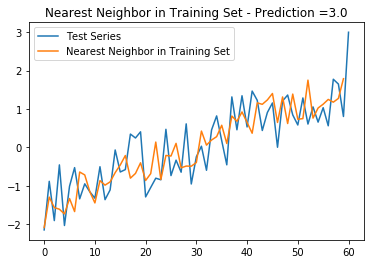

137 points classified


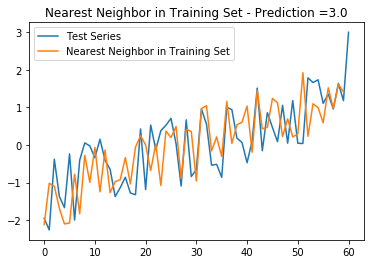

138 points classified


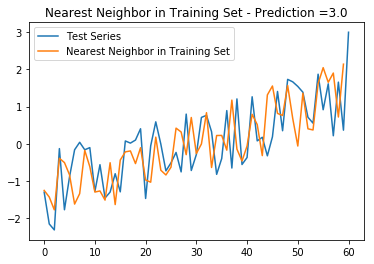

139 points classified


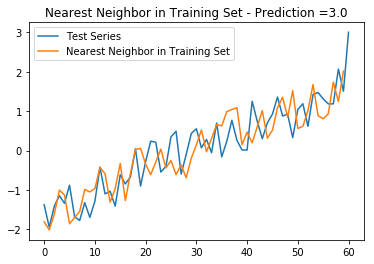

140 points classified


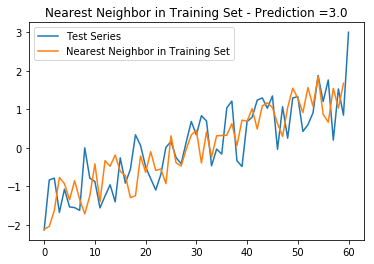

141 points classified


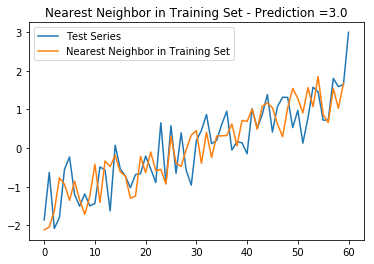

142 points classified


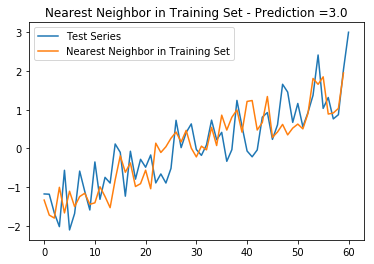

143 points classified


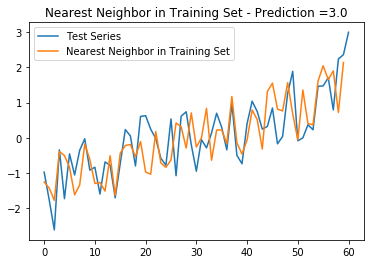

144 points classified


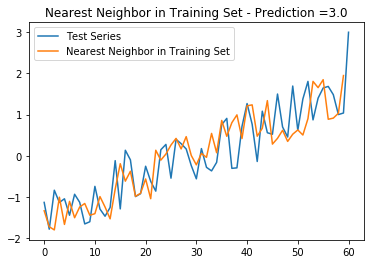

145 points classified


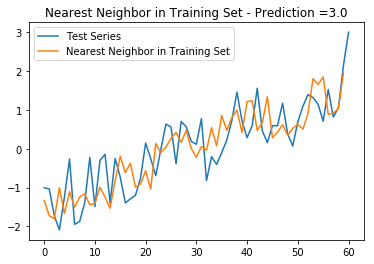

146 points classified


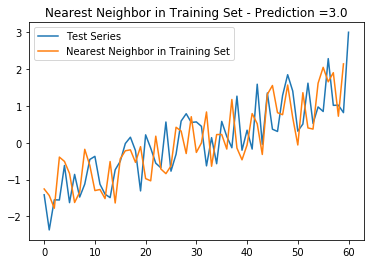

147 points classified


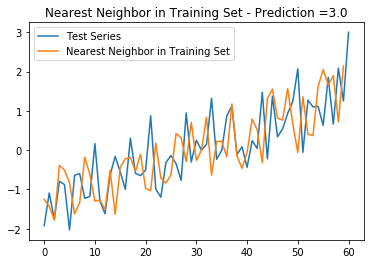

148 points classified


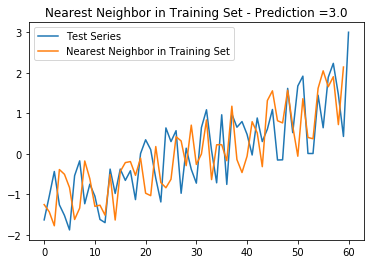

149 points classified


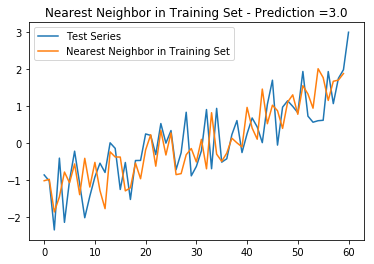

150 points classified


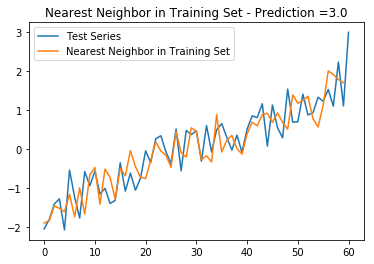

151 points classified


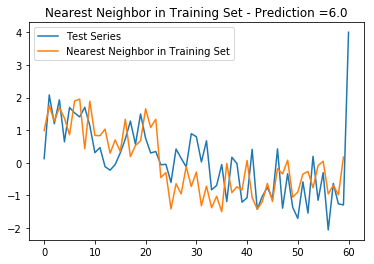

152 points classified


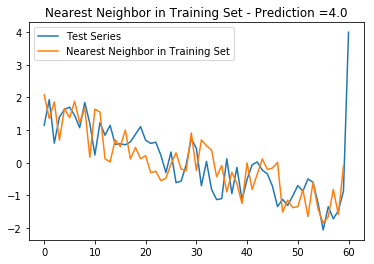

153 points classified


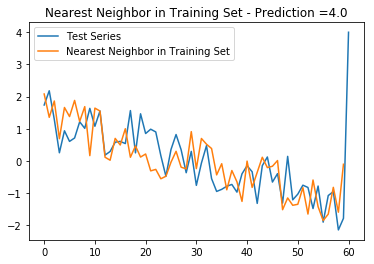

154 points classified


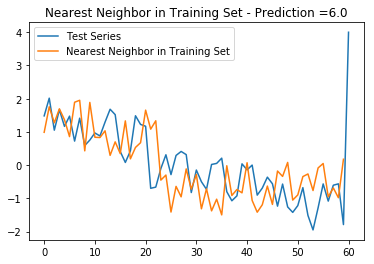

155 points classified


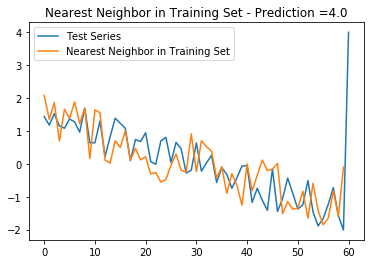

156 points classified


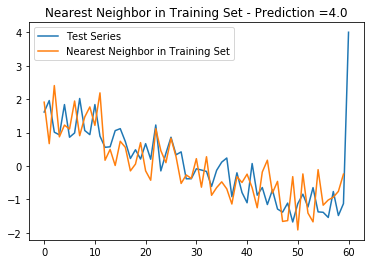

157 points classified


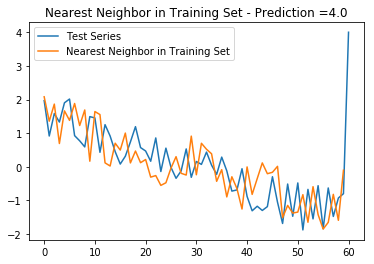

158 points classified


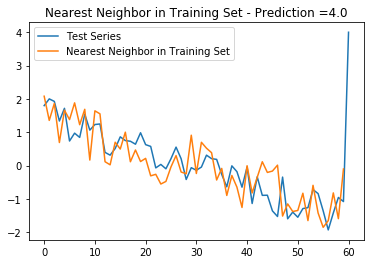

159 points classified


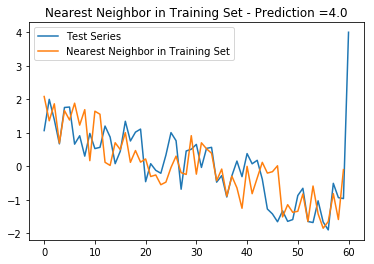

160 points classified


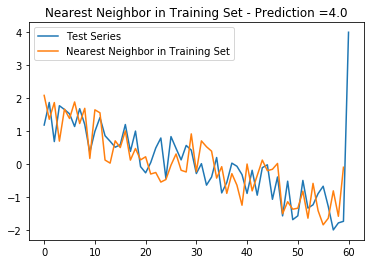

161 points classified


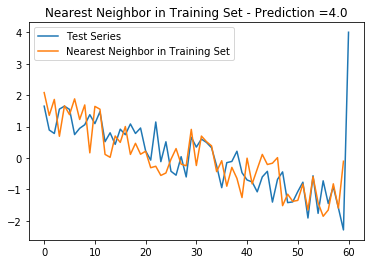

162 points classified


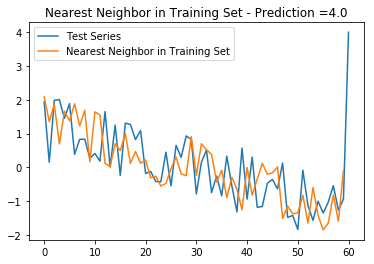

163 points classified


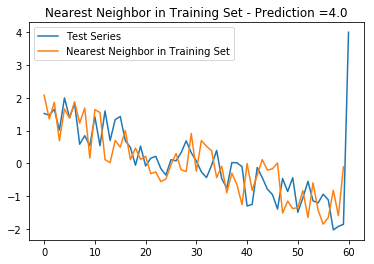

164 points classified


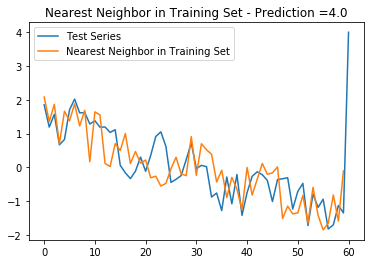

165 points classified


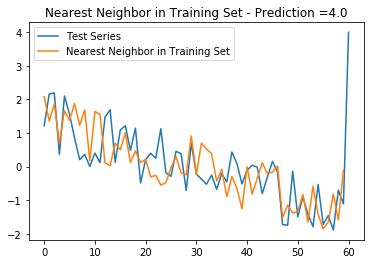

166 points classified


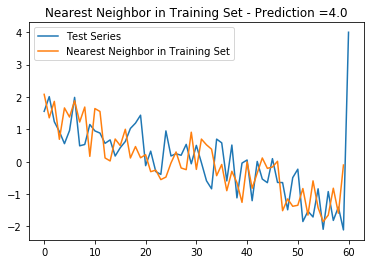

167 points classified


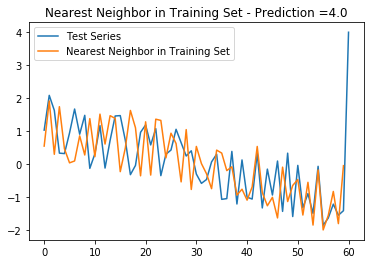

168 points classified


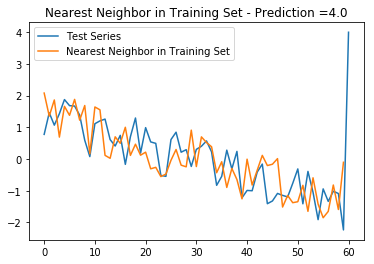

169 points classified


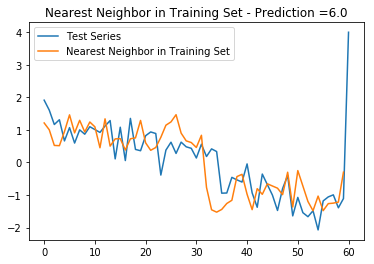

170 points classified


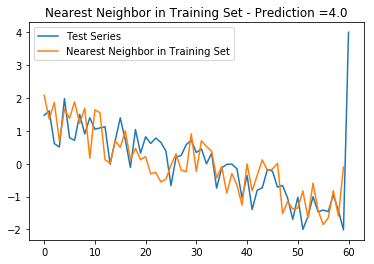

171 points classified


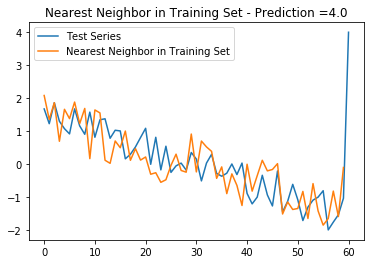

172 points classified


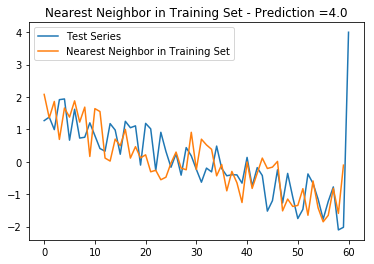

173 points classified


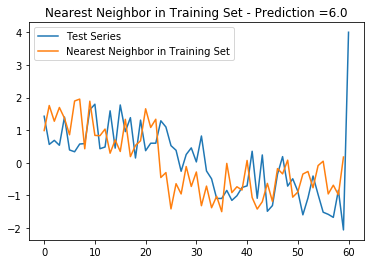

174 points classified


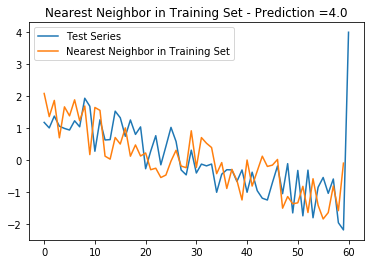

175 points classified


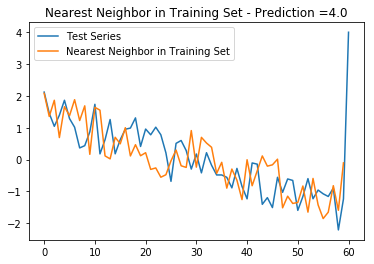

176 points classified


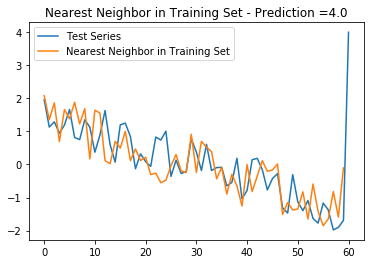

177 points classified


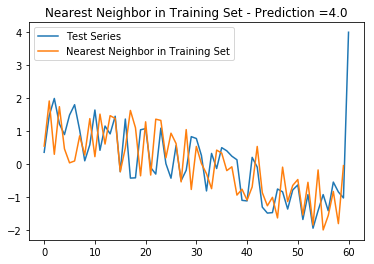

178 points classified


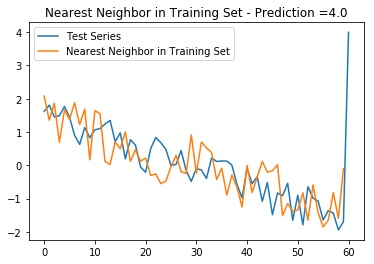

179 points classified


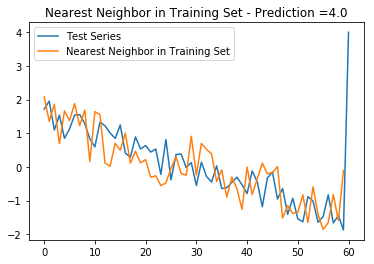

180 points classified


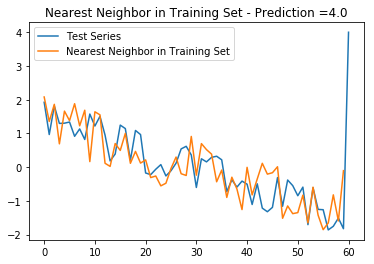

181 points classified


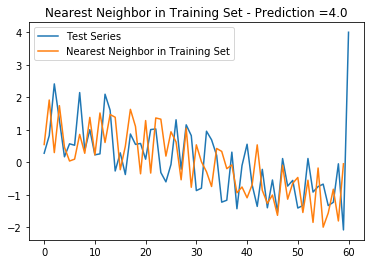

182 points classified


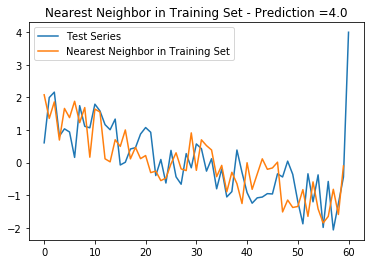

183 points classified


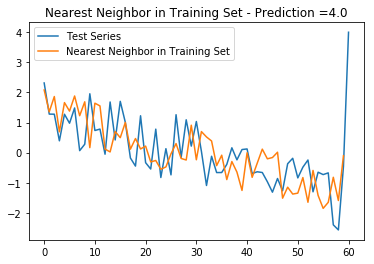

184 points classified


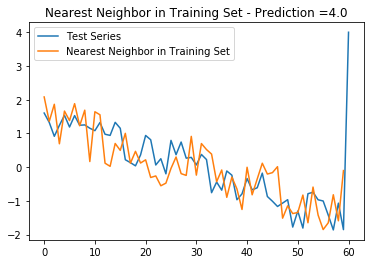

185 points classified


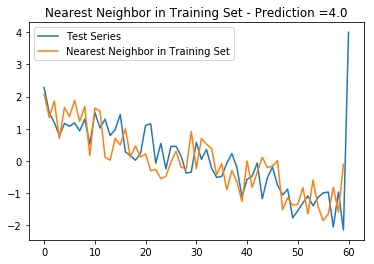

186 points classified


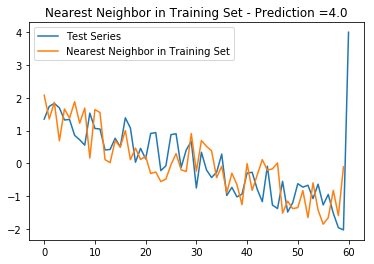

187 points classified


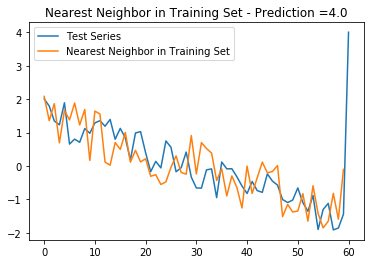

188 points classified


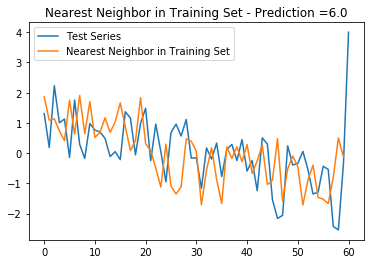

189 points classified


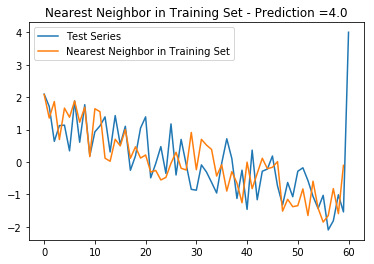

190 points classified


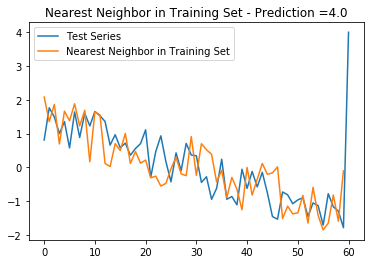

191 points classified


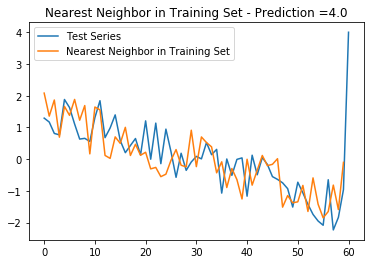

192 points classified


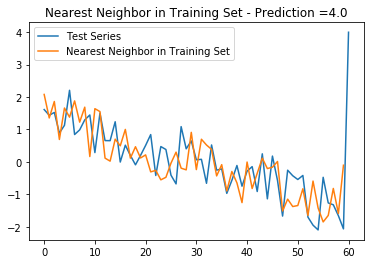

193 points classified


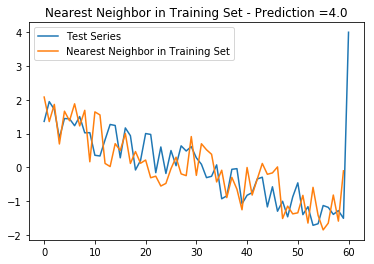

194 points classified


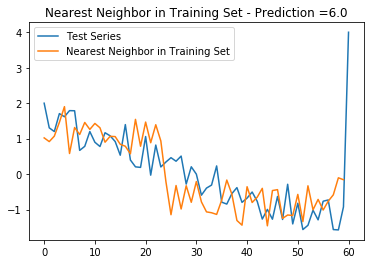

195 points classified


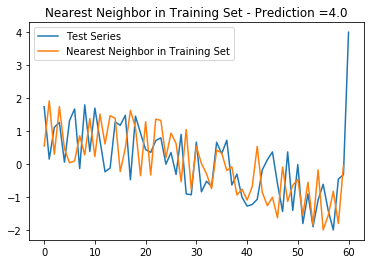

196 points classified


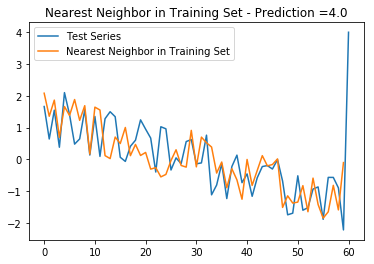

197 points classified


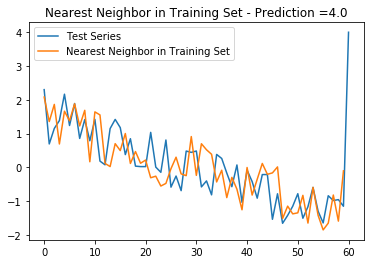

198 points classified


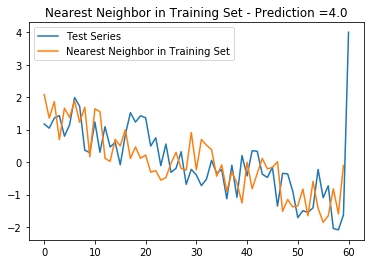

199 points classified


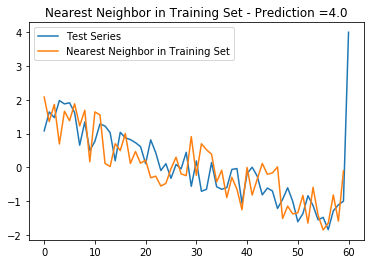

200 points classified


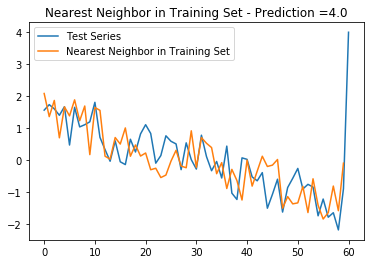

201 points classified


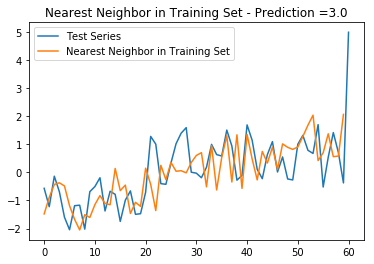

202 points classified


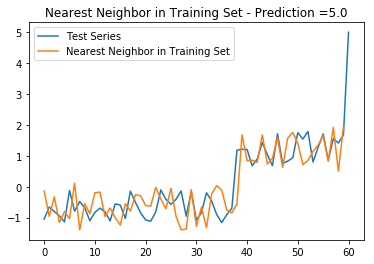

203 points classified


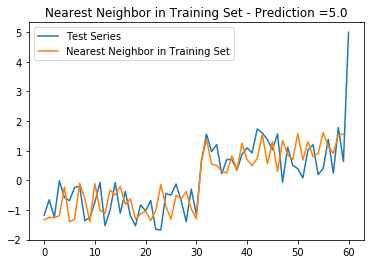

204 points classified


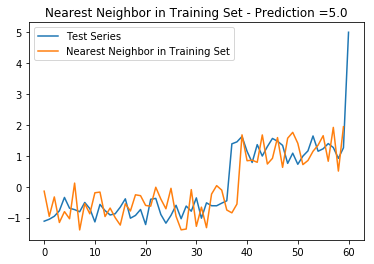

205 points classified


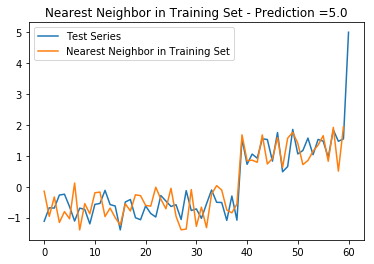

206 points classified


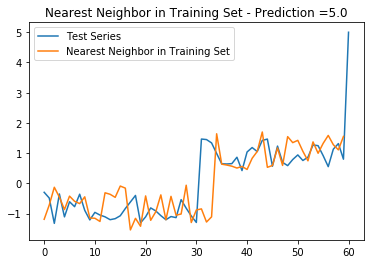

207 points classified


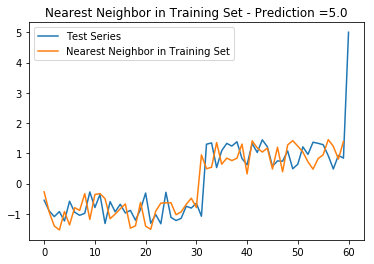

208 points classified


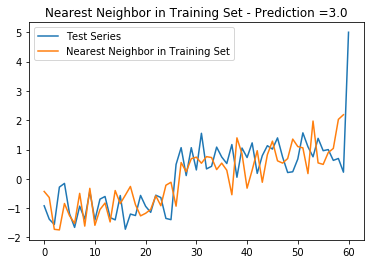

209 points classified


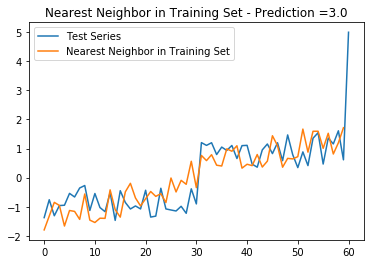

210 points classified


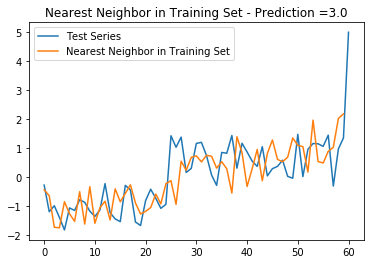

211 points classified


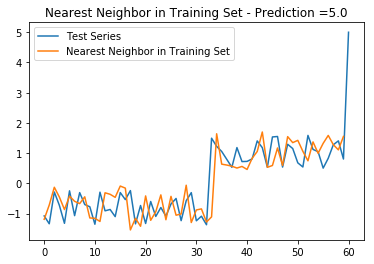

212 points classified


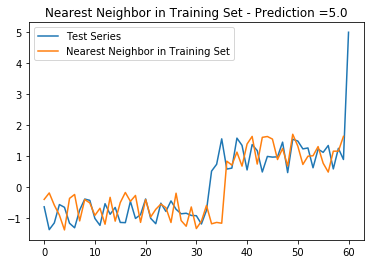

213 points classified


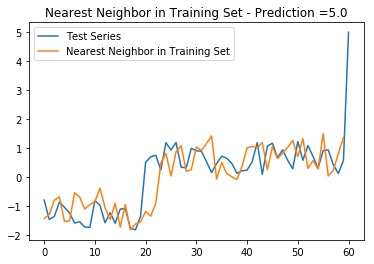

214 points classified


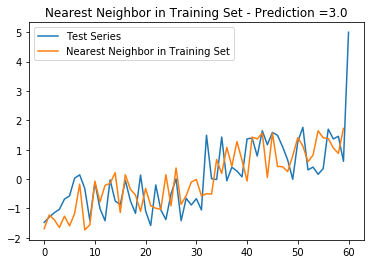

215 points classified


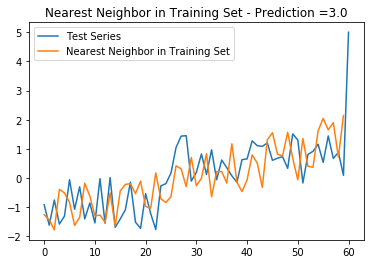

216 points classified


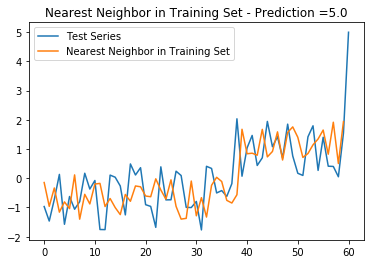

217 points classified


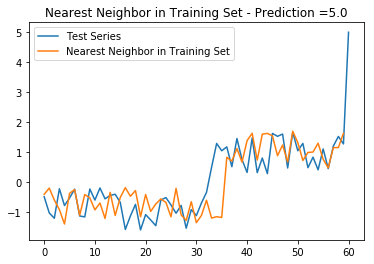

218 points classified


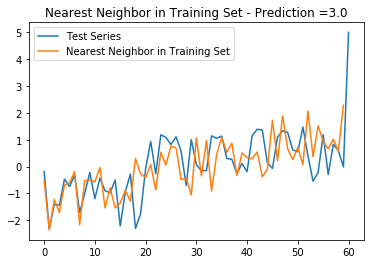

219 points classified


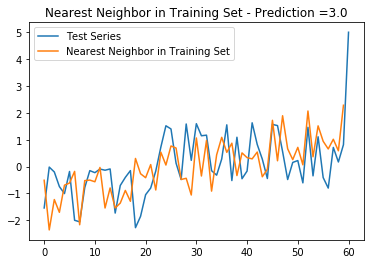

220 points classified


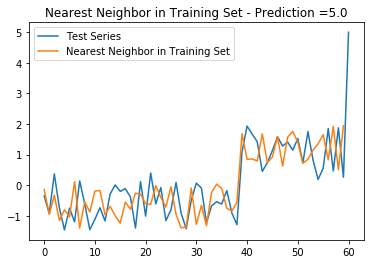

221 points classified


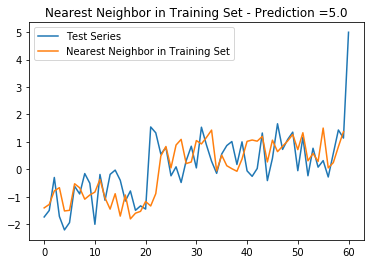

222 points classified


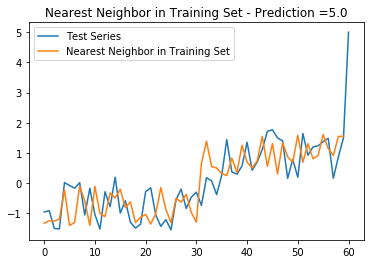

223 points classified


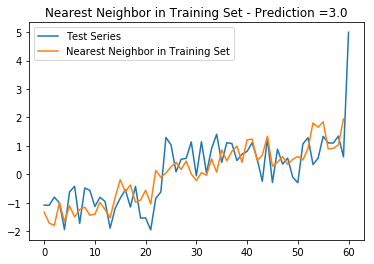

224 points classified


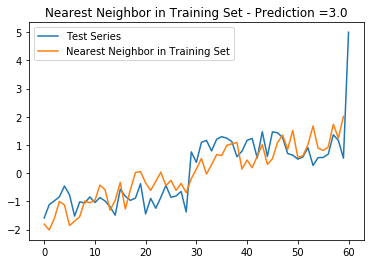

225 points classified


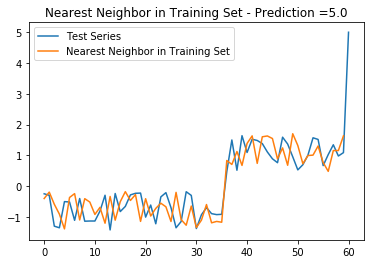

226 points classified


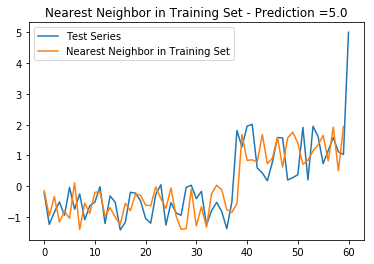

227 points classified


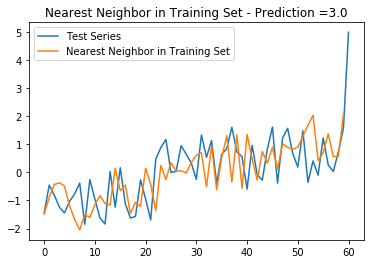

228 points classified


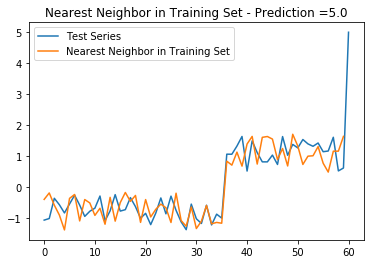

229 points classified


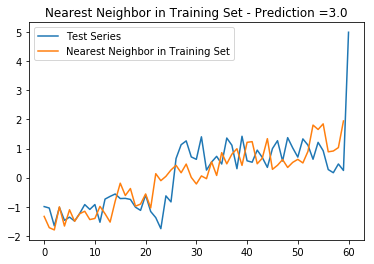

230 points classified


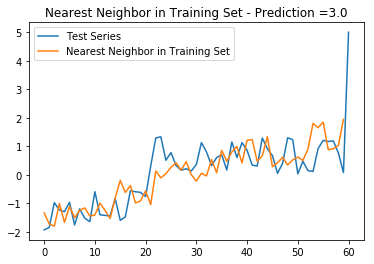

231 points classified


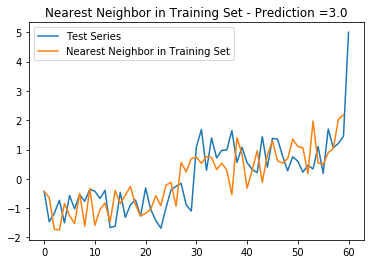

232 points classified


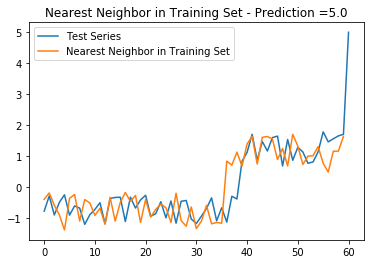

233 points classified


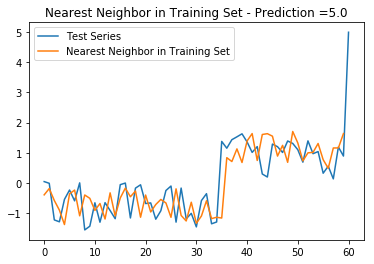

234 points classified


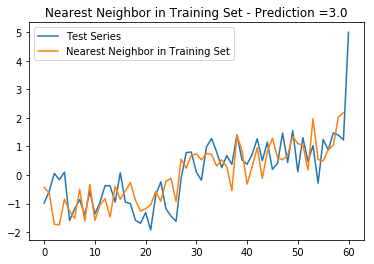

235 points classified


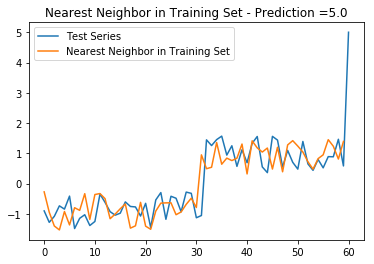

236 points classified


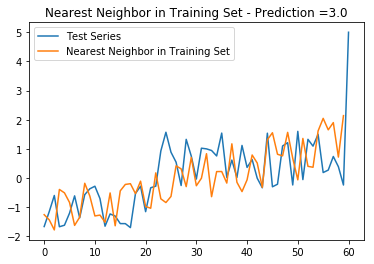

237 points classified


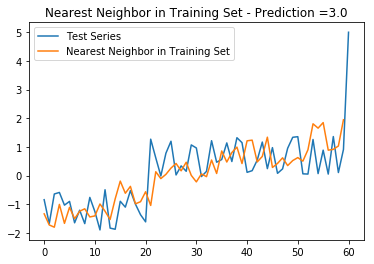

238 points classified


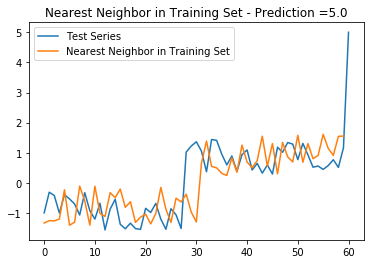

239 points classified


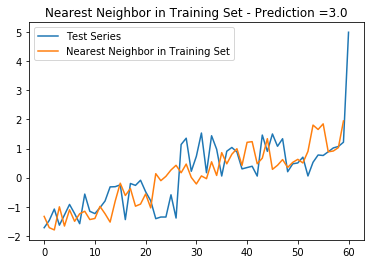

240 points classified


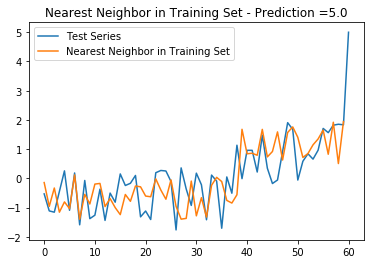

241 points classified


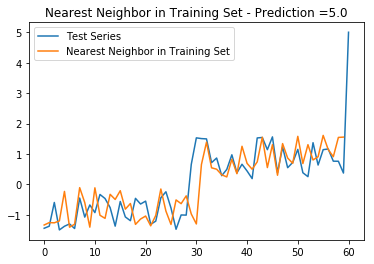

242 points classified


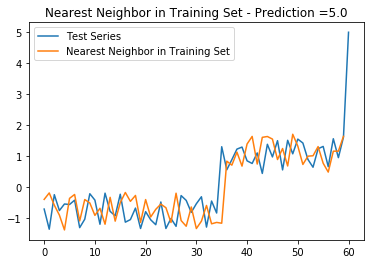

243 points classified


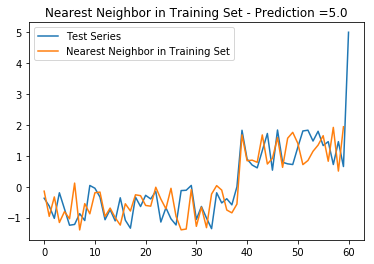

244 points classified


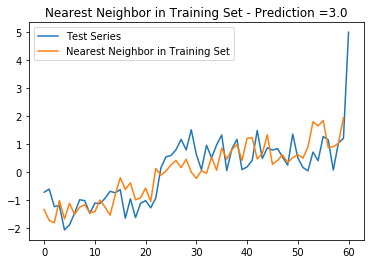

245 points classified


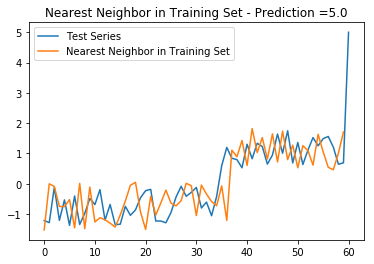

246 points classified


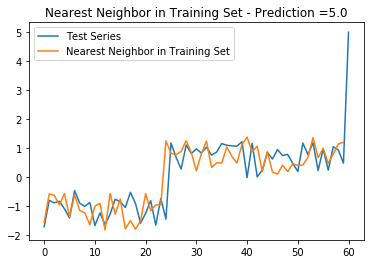

247 points classified


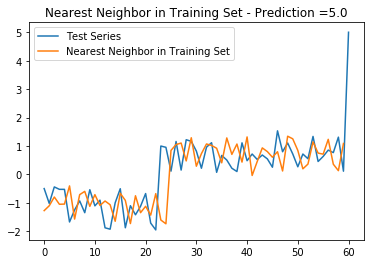

248 points classified


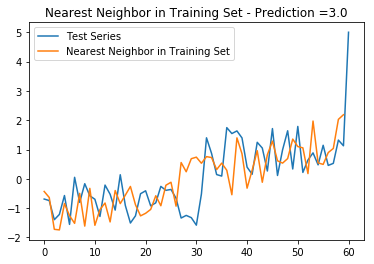

249 points classified


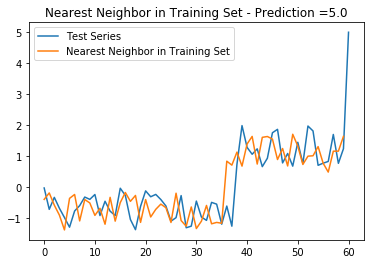

250 points classified


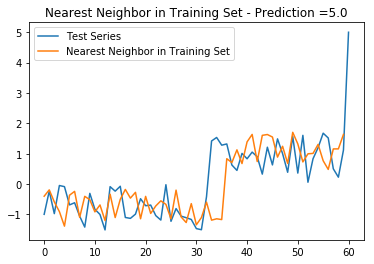

251 points classified


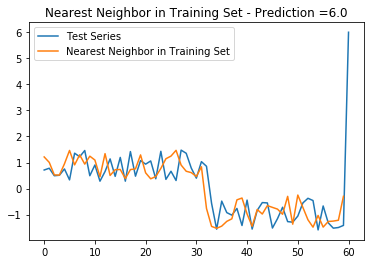

252 points classified


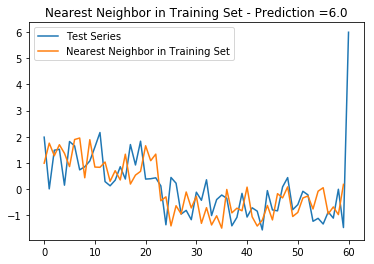

253 points classified


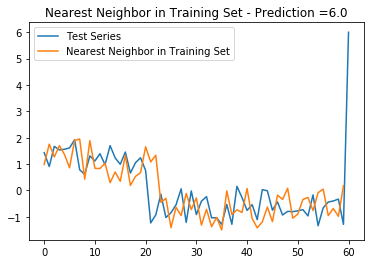

254 points classified


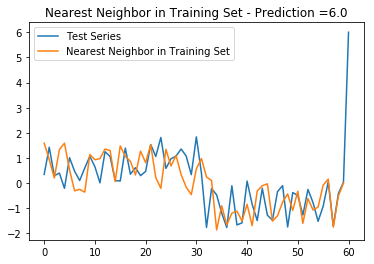

255 points classified


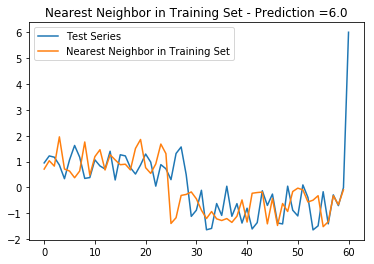

256 points classified


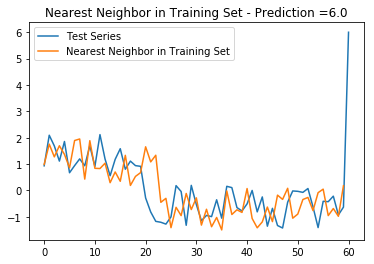

257 points classified


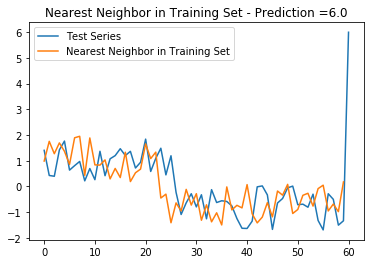

258 points classified


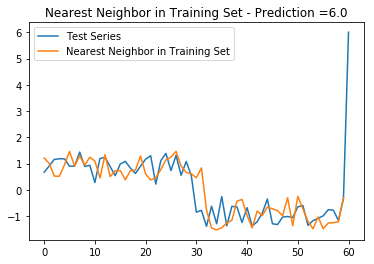

259 points classified


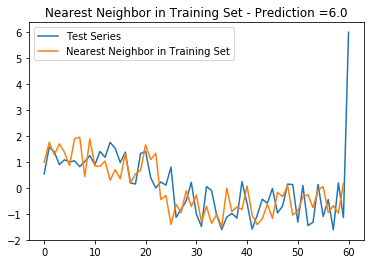

260 points classified


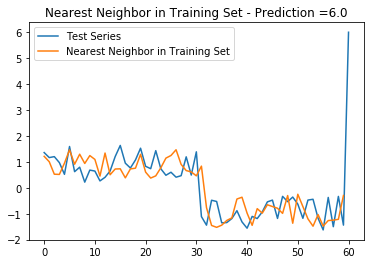

261 points classified


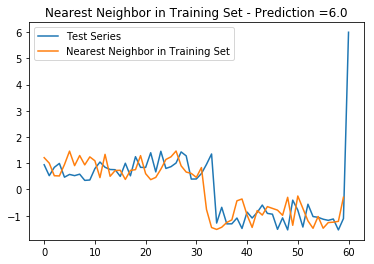

262 points classified


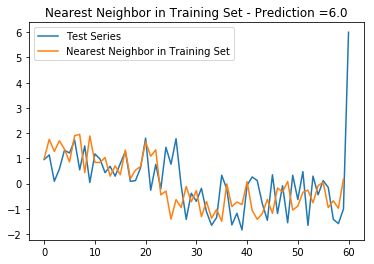

263 points classified


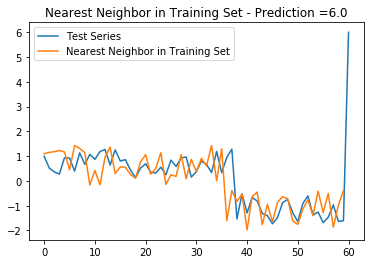

264 points classified


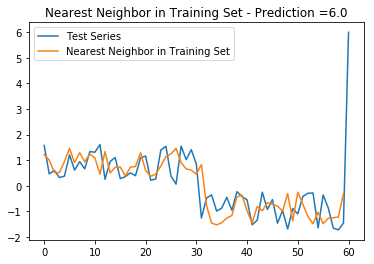

265 points classified


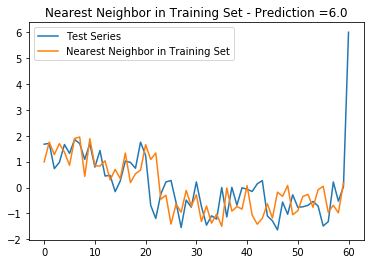

266 points classified


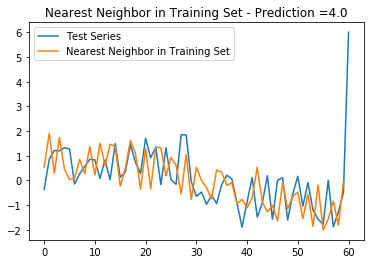

267 points classified


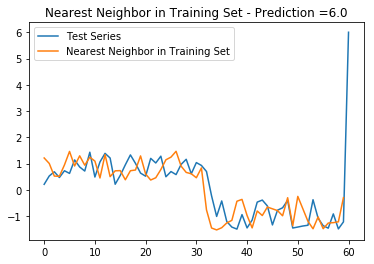

268 points classified


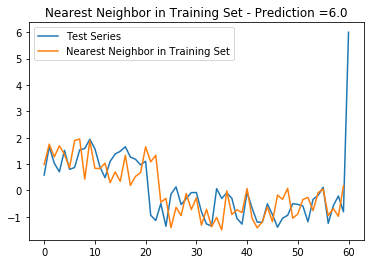

269 points classified


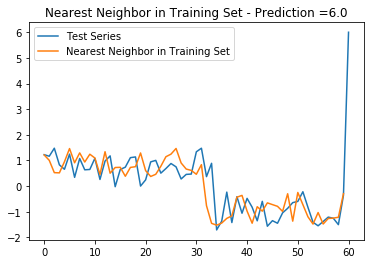

270 points classified


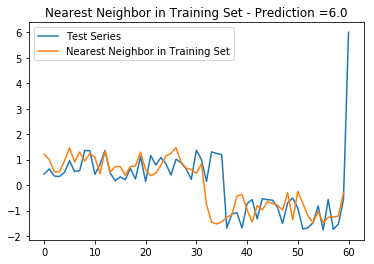

271 points classified


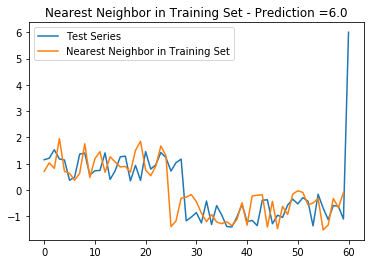

272 points classified


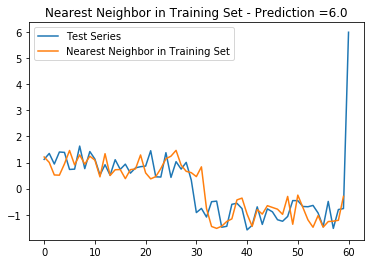

273 points classified


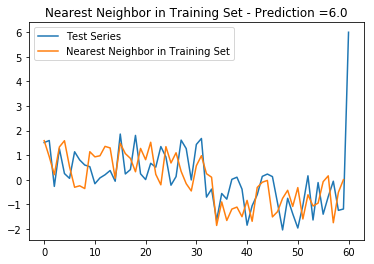

274 points classified


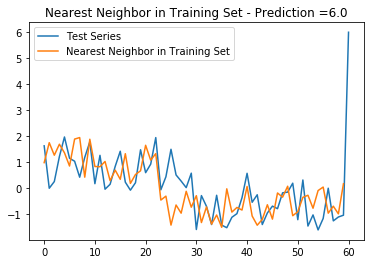

275 points classified


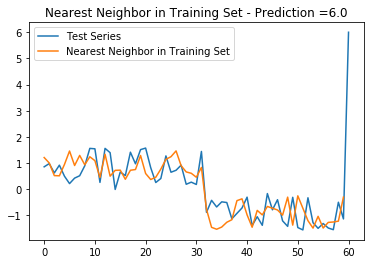

276 points classified


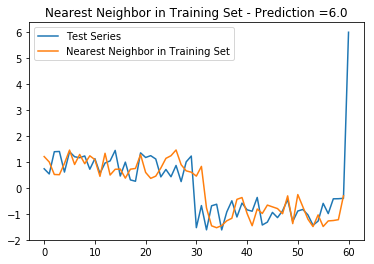

277 points classified


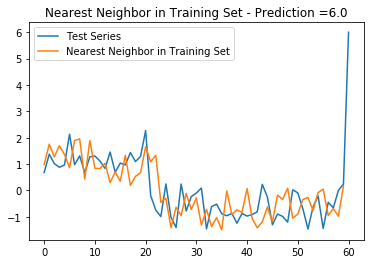

278 points classified


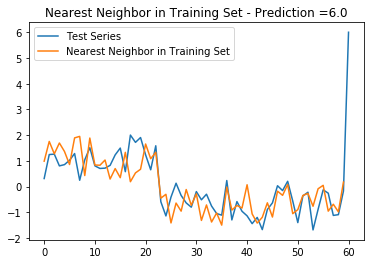

279 points classified


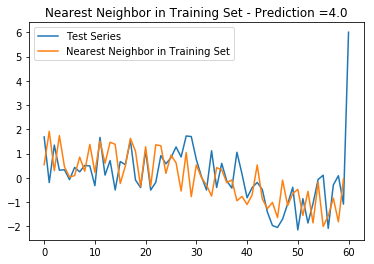

280 points classified


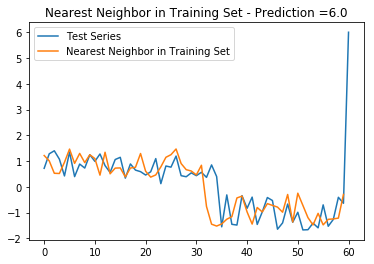

281 points classified


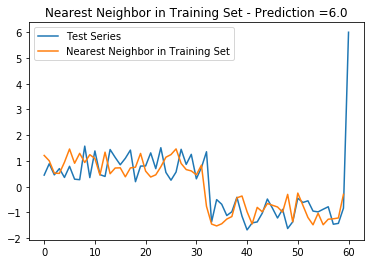

282 points classified


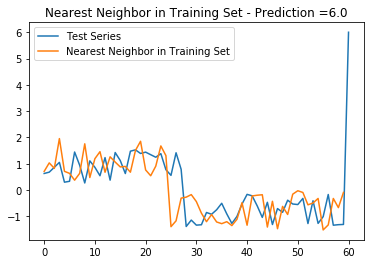

283 points classified


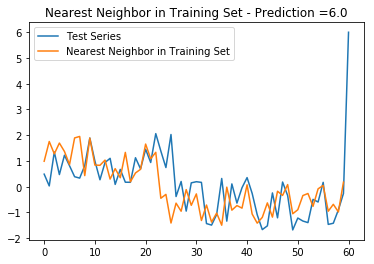

284 points classified


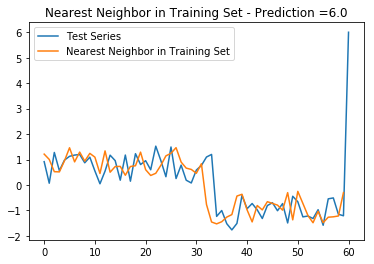

285 points classified


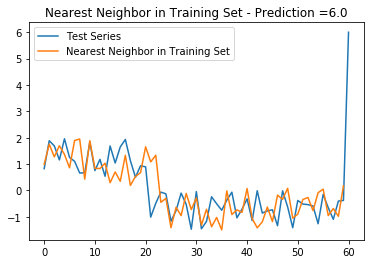

286 points classified


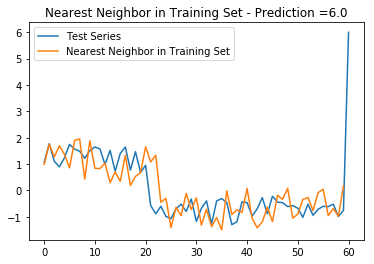

287 points classified


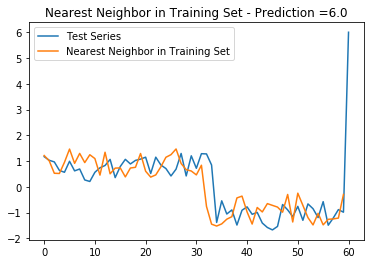

288 points classified


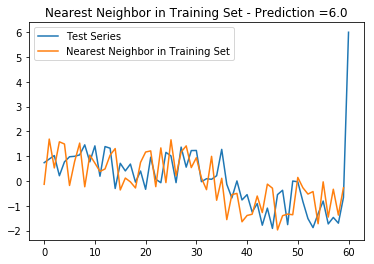

289 points classified


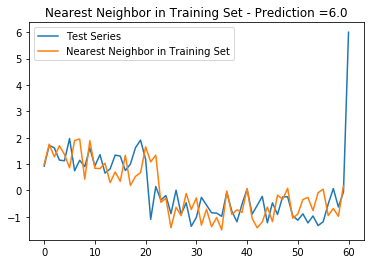

290 points classified


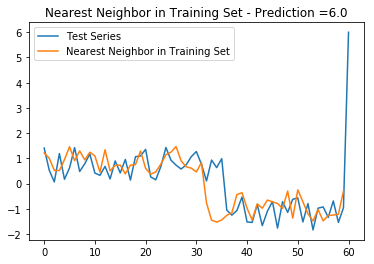

291 points classified


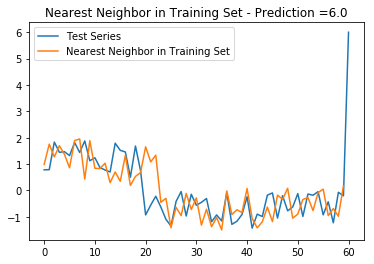

292 points classified


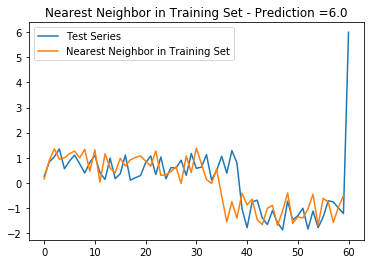

293 points classified


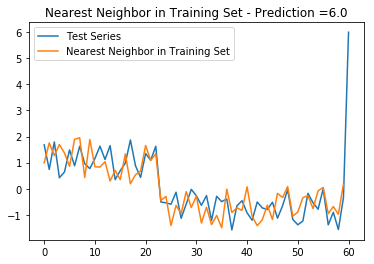

294 points classified


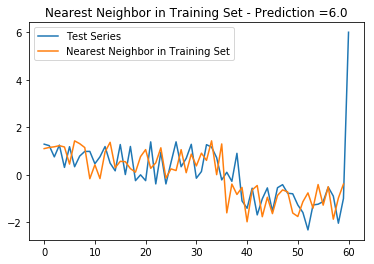

295 points classified


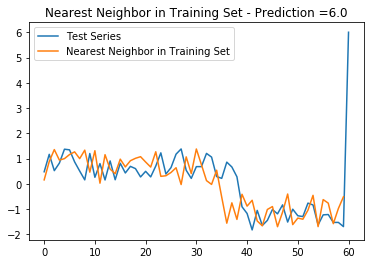

296 points classified


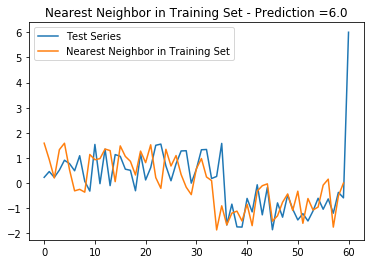

297 points classified


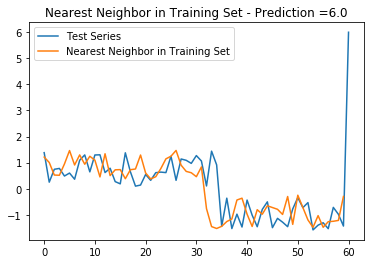

298 points classified


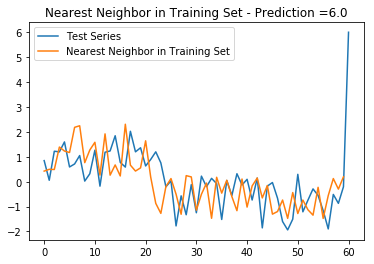

299 points classified


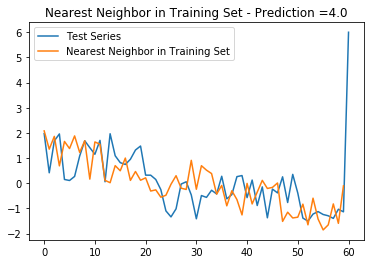

300 points classified


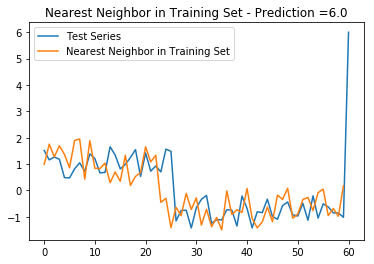

None
279.4212665157911


In [ ]:
from sklearn.metrics import classification_report
import matplotlib.pylab as plt
import numpy as np
import time

class ts_classifier(object):
    
    def __init__(self,plotter = True):
       
        self.preds=[]
        self.plotter=plotter

    def predict(self,train,test,w,progress=True):
      
        for ind,i in enumerate(test):
            if progress:
                print(str(ind+1)+' points classified')
            min_dist=float('inf')
            closest_seq=[]

            for j in train:
                if self.LB_Keough(i,j[:-1],5)<min_dist:
                    dist=self.DTWDistance(i,j[:-1],w)
                    if dist<min_dist:
                        min_dist=dist
                        closest_seq=j
            self.preds.append(closest_seq[-1])
            
            if self.plotter: 
                plt.plot(i)
                plt.plot(closest_seq[:-1])
                plt.legend(['Test Series','Nearest Neighbor in Training Set'])
                plt.title('Nearest Neighbor in Training Set - Prediction ='+str(closest_seq[-1]))
                plt.show()

    
    def performance(self,true_results):
        
        print("Performance : ",+classification_report(true_results,self.preds))   
        return(classification_report(true_results,self.preds))

    def get_preds(self):
        #print("Predictions : ",+self.preds)
        return(self.preds)


    def DTWDistance(self,s1,s2,w=None):
       
        DTW={}
    
        if w:
            w = max(w, abs(len(s1)-len(s2)))
    
            for i in range(-1,len(s1)):
                for j in range(-1,len(s2)):
                    DTW[(i, j)] = float('inf')
    
        else:
            for i in range(len(s1)):
                DTW[(i, -1)] = float('inf')
            for i in range(len(s2)):
                DTW[(-1, i)] = float('inf')

        DTW[(-1, -1)] = 0

        for i in range(len(s1)):
            if w:
                for j in range(max(0, i-w), min(len(s2), i+w)):
                    dist= (s1[i]-s2[j])**2
                    DTW[(i, j)] = dist + min(DTW[(i-1, j)],DTW[(i, j-1)], DTW[(i-1, j-1)])
            else:
                for j in range(len(s2)):
                    dist= (s1[i]-s2[j])**2
                    DTW[(i, j)] = dist + min(DTW[(i-1, j)],DTW[(i, j-1)], DTW[(i-1, j-1)])

        return(np.sqrt(DTW[len(s1)-1, len(s2)-1]))

    def LB_Keough(self,s1,s2,r):
        '''
        Calculates LB_Keough lower bound to dynamic time warping. Linear
        complexity compared to quadratic complexity of dtw.
        '''
        LB_sum=0
        for ind,i in enumerate(s1):
        
            lower_bound=min(s2[(ind-r if ind-r>=0 else 0):(ind+r)])
            upper_bound=max(s2[(ind-r if ind-r>=0 else 0):(ind+r)])

            if i>upper_bound:
                LB_sum=LB_sum+(i-upper_bound)**2
            elif i<lower_bound:
                LB_sum=LB_sum+(i-lower_bound)**2
                
        return np.sqrt(LB_sum)
    
    

    def knn(self,train,test,w):
        self.preds=[]
        for ind,i in enumerate(test):
            min_dist=float('inf')
            closest_seq=[]
            #print ind
            for j in train:
                if self.LB_Keough(i[:-1],j[:-1],5) < min_dist:
                    dist=self.DTWDistance(i[:-1],j[:-1],w)
                    #print(dist)
                    if dist<min_dist:
                        min_dist=dist
                        closest_seq=j
            self.preds.append(closest_seq[-1])
        print(classification_report(test[:,-1],self.preds))
        return(classification_report(test[:,-1],self.preds))
       
        

start = time.clock()
obj = ts_classifier(True)

#dataset = genfromtxt(open('Data/train.csv','r'), delimiter=',', dtype='f8')[1:]
train = np.genfromtxt('Desktop/train.csv', delimiter='\t')
test = np.genfromtxt('Desktop/test.csv', delimiter='\t')
w = 4
#knn(train,test,4)
#obj.knn(train,test,w)
print(obj.knn(train,test,w))
print(obj.predict(train,test,w,True))

print(time.clock()-start)


In [1]:
from sklearn.metrics import classification_report
import matplotlib.pylab as plt
import numpy as np
import time

class ts_classifier(object):
    
    def __init__(self,plotter = True):
       
        self.preds=[]
        self.plotter=plotter

    def predict(self,train,test,w,progress=True):
      
        for ind,i in enumerate(test):
            if progress:
                print(str(ind+1)+' points classified')
            min_dist=float('inf')
            closest_seq=[]

            for j in train:
                if self.LB_Keough(i,j[:-1],5)<min_dist:
                    dist=self.DTWDistance(i,j[:-1],w)
                    if dist<min_dist:
                        min_dist=dist
                        closest_seq=j
            self.preds.append(closest_seq[-1])
            
            if self.plotter: 
                plt.plot(i)
                plt.plot(closest_seq[:-1])
                plt.legend(['Test Series','Nearest Neighbor in Training Set'])
                plt.title('Nearest Neighbor in Training Set - Prediction ='+str(closest_seq[-1]))
                plt.show()

    
    def performance(self,true_results):
        
        print("Performance : ",+classification_report(true_results,self.preds))   
        return(classification_report(true_results,self.preds))

    def get_preds(self):
        #print("Predictions : ",+self.preds)
        return(self.preds)


    def DTWDistance(self,s1,s2,w=None):
       
        DTW={}
    
        if w:
            w = max(w, abs(len(s1)-len(s2)))
    
            for i in range(-1,len(s1)):
                for j in range(-1,len(s2)):
                    DTW[(i, j)] = float('inf')
    
        else:
            for i in range(len(s1)):
                DTW[(i, -1)] = float('inf')
            for i in range(len(s2)):
                DTW[(-1, i)] = float('inf')

        DTW[(-1, -1)] = 0

        for i in range(len(s1)):
            if w:
                for j in range(max(0, i-w), min(len(s2), i+w)):
                    dist= (s1[i]-s2[j])**2
                    DTW[(i, j)] = dist + min(DTW[(i-1, j)],DTW[(i, j-1)], DTW[(i-1, j-1)])
            else:
                for j in range(len(s2)):
                    dist= (s1[i]-s2[j])**2
                    DTW[(i, j)] = dist + min(DTW[(i-1, j)],DTW[(i, j-1)], DTW[(i-1, j-1)])

        return(np.sqrt(DTW[len(s1)-1, len(s2)-1]))

    def LB_Keough(self,s1,s2,r):
        '''
        Calculates LB_Keough lower bound to dynamic time warping. Linear
        complexity compared to quadratic complexity of dtw.
        '''
        LB_sum=0
        for ind,i in enumerate(s1):
        
            lower_bound=min(s2[(ind-r if ind-r>=0 else 0):(ind+r)])
            upper_bound=max(s2[(ind-r if ind-r>=0 else 0):(ind+r)])

            if i>upper_bound:
                LB_sum=LB_sum+(i-upper_bound)**2
            elif i<lower_bound:
                LB_sum=LB_sum+(i-lower_bound)**2
                
        return np.sqrt(LB_sum)
    
    

    def knn(self,train,test,w):
        self.preds=[]
        for ind,i in enumerate(test):
            min_dist=float('inf')
            closest_seq=[]
            #print ind
            for j in train:
                if self.LB_Keough(i[:-1],j[:-1],5) < min_dist:
                    dist=self.DTWDistance(i[:-1],j[:-1],w)
                    #print(dist)
                    if dist<min_dist:
                        min_dist=dist
                        closest_seq=j
            self.preds.append(closest_seq[-1])
        print(classification_report(test[:,-1],self.preds))
        return(classification_report(test[:,-1],self.preds))
       
        

start = time.clock()
obj = ts_classifier(True)

#dataset = genfromtxt(open('Data/train.csv','r'), delimiter=',', dtype='f8')[1:]
train = np.genfromtxt('Desktop/gun_train.csv', delimiter='\t')
test = np.genfromtxt('Desktop/gun_test.csv', delimiter='\t')
w = 4
#knn(train,test,4)
#obj.knn(train,test,w)
print(obj.knn(train,test,w))
print(obj.predict(train,test,w,True))

print(time.clock()-start)


IndexError: invalid index to scalar variable.